In [1]:
%%html
<style>
.text_cell {
    font-family: "Vazir", "Segoe UI";
}
.rendered_html p {
    text-align: right;
}
.text_cell {
    direction: rtl;
}
div.input {
    flex-direction: row-reverse;
}
</style>

# هوش مصنوعی - پروژهٔ پنجم
## حسین سلطانلو - ۸۱۰۱۹۵۴۰۷

ابتدا کتاب‌خانه‌های موردنیاز را import می‌کنیم:

In [4]:
import torchvision
import torch
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision.datasets import ImageFolder
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision import transforms, utils
import torch.nn as nn
import torch.nn.functional as F
import time
from datetime import timedelta
from datetime import datetime
from matplotlib.pyplot import figure

یک Transform مخصوص تبدیل تصاویر به Tensorهای قابل‌پردازش در PyTorch می‌سازیم:

In [5]:
class CustomToTensor(object):
    """Convert PIL Images in sample to pytorch Tensors."""
    
    def __call__(self, image):
        image = np.array(image, dtype=np.float32)
        return torch.from_numpy(image)

تصاویر را از فایل‌ها می‌خوانیم و سپس در دو مرحله تبدیل‌ها را انجام می‌دهیم. تبدیل اول تصاویر را Grayscale می‌کند و تبدیل دوم هم همان تبدیلی است که خودمان ساختیم:

In [6]:
transform = transforms.Compose([transforms.Grayscale(), CustomToTensor()])
dataset = ImageFolder("/content/data", transform=transform)

در این مرحله اقدام به استخراج تعداد تصاویر هر دسته و هم‌چنین indexهای مربوط به آن‌ها می‌کنیم تا از آن‌ها در تقسیم داده‌ها استفاده کنیم:

In [7]:
from collections import defaultdict
indices_by_classes = defaultdict(list)
default_loader = torch.utils.data.DataLoader(dataset, num_workers=64)
idx = 0
for batch, label in default_loader:
  indices_by_classes[label.item()].append(idx)
  idx = idx + 1

In [8]:
def multiple_imshow(img_array, labels, classes):
    _, axs = plt.subplots(3, 4) 
    for i in range(3):
      for j in range(4):
        axs[i][j].imshow((img_array[i * 4 + j]), cmap='gray')
        axs[i][j].set_title(labels[i * 4 + j])
        axs[i][j].axis('off')
    plt.show()

sample_images_indices = []
for i in range(12):
  sample_images_indices.append(indices_by_classes[i][0])

sample_images = [dataset[i][0] for i in sample_images_indices]

## بخش ۱

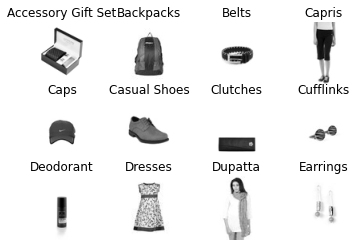

In [ ]:
multiple_imshow(sample_images, dataset.classes[0:12], dataset.classes)

## بخش ۲
### الف)
مشاهده می شود که دسته‌ی Tshirts دارای بیشترین و دسته‌ی Kajal and Eyeliner دارای کم‌ترین تعداد داده‌های هستند:

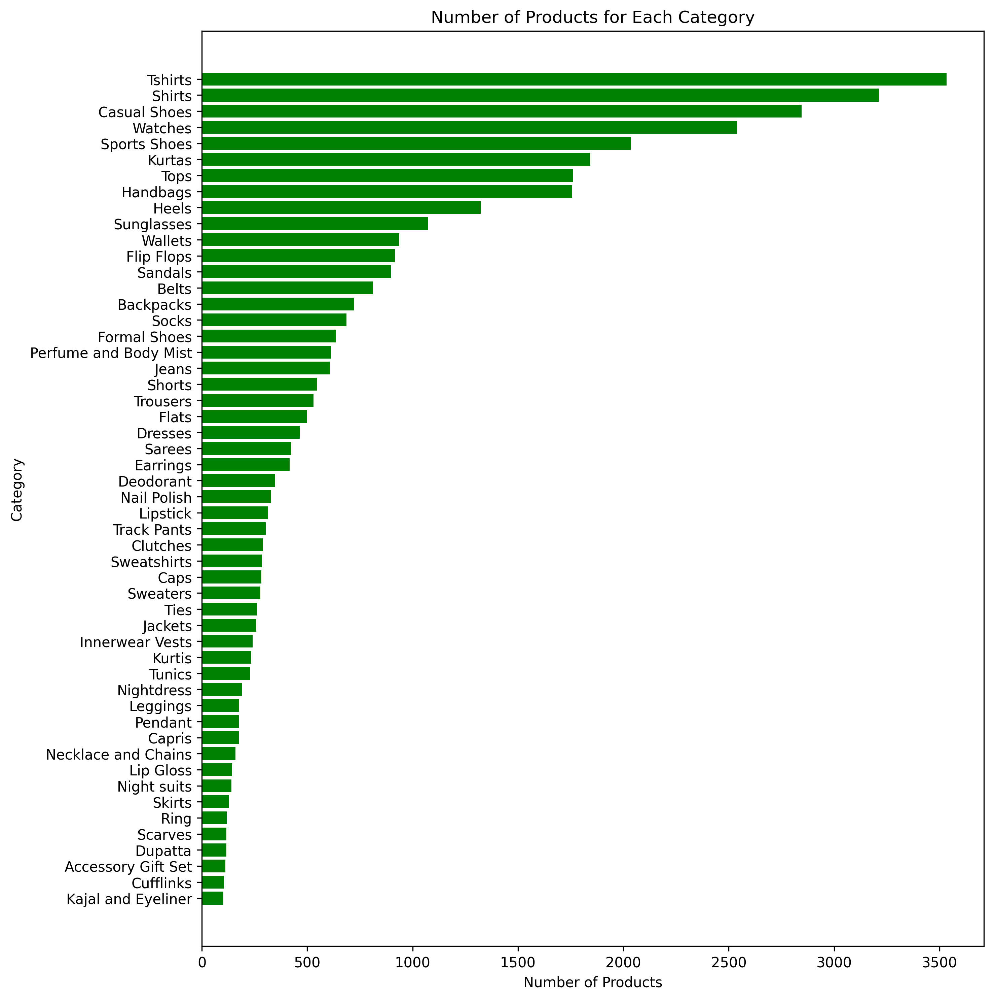

In [ ]:
abundance_by_class = [(i, len(indices_by_classes[i])) for i in range(len(dataset.classes))]
abundance_by_class.sort(key=lambda tup: tup[1])
x_pos = []
y = []
for item in abundance_by_class:
  x_pos.append(item[0])
  y.append(item[1])

class_names = [dataset.classes[i] for i in x_pos]

def barh(x, y, yticks, xlabel, ylabel, title):
  figure(num=None, figsize=(10, 12), dpi=300, facecolor='w', edgecolor='k')
  plt.barh(x, y, color='green')
  plt.ylabel(ylabel)
  plt.xlabel(xlabel)
  plt.title(title)
  plt.yticks(x, yticks)
  plt.show()

barh(range(len(dataset.classes)), y, class_names, "Number of Products", "Category", "Number of Products for Each Category")

### ب)
حال از هر دسته ۲۰ درصد را به مجموعه‌ی تست و باقی را به مجموعه‌ی آموزش تخصیص می‌دهیم:

In [9]:
batch_size = 64

dataset_size = len(dataset)

train_indices = []
test_indices = []
test_split = .2
np.random.seed(42)
for i in range(dataset_size):
  split = int(np.floor(test_split * len(indices_by_classes[i])))
  train_indices.extend(indices_by_classes[i][split:])
  test_indices.extend(indices_by_classes[i][:split])
np.random.shuffle(train_indices)
np.random.shuffle(test_indices)

train_sampler = SubsetRandomSampler(train_indices)
test_sampler = SubsetRandomSampler(test_indices)

train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=train_sampler, num_workers=64)
test_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=test_sampler, num_workers=64)

In [10]:
classes = dataset.classes

## بخش ۳
در این قسمت یک شبکه‌ی عصبی با ۵ لایه تشکیل می‌دهیم که لایه‌های آن به‌ترتیب دارای ۳۰۰۰، ۴۰۰۰، ۵۰۰۰، ۲۰۰۰ و ۵۲ نورون هستند. لازم‌به‌ذکر است که لایه‌ی اول دارای ۴۸۰۰ ورودی است که دلیل آن نیز اختصاص یک ورودی به هر پیکسل از تصاویر ۶۰در۸۰ پیکسلی است. لایه‌ی آخر نیز به دلیل این‌که کلاس تصاویر را مشخص می‌کند و ۵۲ کلاس در این مجموعه‌ی داده موجود است، دارای ۵۲ نورون است.

گفتنی‌ست که مبنای خاصی برای انتخاب این تعداد نورون برای لایه‌های مخفی وجود نداشته و چون این شبکه در تست‌ها دقت خوبی (در محدوده‌ی خواسته‌شده‌ی پروژه) کسب کرده است، تغییری در آن نداده‌ام. 

In [11]:
class Model(nn.Module):
    def __init__(self, class_num, act=F.relu):
        super(Model, self).__init__()


        self.layer1 = nn.Linear(60 * 80, 3000)
        self.act1 = act


        self.layer2 = nn.Linear(3000, 4000)
        self.act2 = act



        self.layer3 = nn.Linear(4000, 5000)
        self.act3 = act


        self.layer4 = nn.Linear(5000, 2000)
        self.act4 = act

        self.layer5 = nn.Linear(2000, class_num)

    def forward(self, x):

        x = x.view(x.size(0), -1)

        x = self.layer1(x)
        x = self.act1(x)

        x = self.layer2(x)
        x = self.act2(x)

        x = self.layer3(x)
        x = self.act3(x)

        x = self.layer4(x)
        x = self.act4(x)

        x = self.layer5(x)
        return x

In [12]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

با دستورات زیر یک مدل ایجاد می‌کنیم و آن را به GPU منتقل می‌کنیم تا از سرعت پردازش آن بهره ببریم:

In [ ]:
model = Model(len(classes))
model = model.to(device)

### الف)
در جدول زیر تعداد پارامترهای هر لایه را مشاهده می‌کنیم که به تفکیک پارامترهای مربوط به وزن و بایاس هر لایه نمایش داده شده است. تعداد کل پارامترهای قابل آموزش نیز ۵۶۵۱۸۰۵۲ عدد است.

تعداد پارامترهای بایاس به این دلیل برابر با تعداد نورون‌هاست که هر نورون یک بایاس مشخص دارد که اعمال می‌کند. تعداد پارامترهای مربوط به وزن هر لایه برابر با تعداد نورون‌های آن لایه ضرب‌در نورون‌های لایه‌ی قبل از آن است؛ به این دلیل که لایه‌ها Linear هستند و از هر نورون در یک لایه به تمامی نورون‌های لایه‌ی بعد یک یال متصل می‌شود. در نهایت مجموع این پارامترها، تعداد کل پارامترهای قابل آموزش را مشخص می‌کند.

In [ ]:
from prettytable import PrettyTable

def count_parameters(model):
    table = PrettyTable(["Modules", "Parameters"])
    total_params = 0
    for name, parameter in model.named_parameters():
        if not parameter.requires_grad: continue
        param = parameter.numel()
        table.add_row([name, param])
        total_params+=param
    print(table)
    print(f"Total Trainable Params: {total_params}")
    return total_params
    
total_trainable_params = count_parameters(model)

+---------------+------------+
|    Modules    | Parameters |
+---------------+------------+
| layer1.weight |  14400000  |
|  layer1.bias  |    3000    |
| layer2.weight |  12000000  |
|  layer2.bias  |    4000    |
| layer3.weight |  20000000  |
|  layer3.bias  |    5000    |
| layer4.weight |  10000000  |
|  layer4.bias  |    2000    |
| layer5.weight |   104000   |
|  layer5.bias  |     52     |
+---------------+------------+
Total Trainable Params: 56518052


تابع زیر کار آموزش مدل را بر عهده دارد. در هر مرحله یا epoch به ازای هر batch از اطلاعات، خروجی‌های شبکه محاسبه شده و سپس با استفاده از تابع loss، میزان خطا محاسبه شده و با استفاده از back propagation این خطا کاسته می‌شود.

In [13]:
def fit(model, train_loader, device, criterion, optimizer, num_epochs=10):

  total_time = 0.
  average_losses = []

  for epoch in range(num_epochs):
      train_loss = 0.
      d1 = datetime.now()
      for images, labels in train_loader:
          
        images = images.to(device)
        labels = labels.to(device)

        # Clear gradients w.r.t. parameters
        optimizer.zero_grad()

        # Forward pass to get output/logits
        outputs = model(images)

        # Calculate Loss: softmax --> cross entropy loss
        loss = criterion(outputs, labels)

        # Getting gradients w.r.t. parameters
        loss.backward()

        # Updating parameters
        optimizer.step()
        train_loss += loss.item()

      average_loss = train_loss / len(train_loader)
      average_losses.append(average_loss)
      d2 = datetime.now()
      delta = d2 - d1
      seconds = float(delta.total_seconds())
      total_time += seconds
      print('epoch %d, train_loss: %.3f, time elapsed: %s seconds' % (epoch + 1, average_loss, seconds))
  print('total training time: %.3f minutes' % (total_time / 60))
  return average_losses

تابع زیر نیز به‌منظور سنجش میزان دقت شبکه استفاده می شود که دقت هر کلاس به تفکیک و دقت کلی شبکه را خروجی می‌دهد:

In [14]:
def test_model_accuracy(model, data_loader, classes):
    correct = 0.
    total = 0.
    nb_classes = len(classes)
    confusion_matrix = torch.zeros(nb_classes, nb_classes)

    with torch.no_grad():
      for images, labels in data_loader:
        outputs = model(images.to(device))
        _, predicted = torch.max(outputs.data, 1)
        for t, p in zip(labels.view(-1), predicted.view(-1)):
                confusion_matrix[t.long(), p.long()] += 1
        total += labels.size(0)
        correct += (predicted.to('cpu') == labels).sum().item()

    accuracy = 100 * correct / total
    return accuracy, confusion_matrix.diag()/confusion_matrix.sum(1)


از تابع زیر برای مقداردهی اولیه‌ی وزن‌ها استفاده می‌کنیم:

In [15]:
def init_weights(m):
    if type(m) == nn.Linear:
        torch.nn.init.constant_(m.weight, 0)

In [27]:
def train_and_test(classes, device, train_loader, test_loader, momentum=0, num_epochs=10, act=F.relu, weight_decay=0, learning_rate=0.01, zero_weights=False):
  model = Model(len(classes), act=act)
  if zero_weights:
    model.apply(init_weights)
  model = model.to(device)
  criterion = nn.CrossEntropyLoss()
  optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=momentum, weight_decay=weight_decay)
  average_losses = fit(model, train_loader, device, criterion, optimizer, num_epochs)
  test_accuracy, test_classes_accuracy = test_model_accuracy(model, test_loader, classes)
  train_accuracy, train_classes_accuracy = test_model_accuracy(model, train_loader, classes)
  return test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses

توابع زیر نیز فقط جنبه‌ی نمایش اطلاعات را دارند:

In [17]:
def plot_loss(x, y):
  plt.plot(x, y)
  plt.title("Average Loss For Each Epoch")
  plt.xlabel("Epoch")
  plt.ylabel("Average Loss")
  plt.xticks(x, [i+1 for i in x])
  plt.show()

def multi_barh(x, y_train, y_test, yticks, xlabel, ylabel, title):
  figure(num=None, figsize=(10, 12), dpi=300, facecolor='w', edgecolor='k')
  ind = np.arange(len(y_train))
  width = 0.4
  plt.barh(ind, y_train, width, label='Train')
  plt.barh(ind + width, y_test, width, label='Test')
  plt.legend(loc='best')
  plt.ylabel(ylabel)
  plt.xlabel(xlabel)
  plt.title(title)
  plt.ylim=[0, len(y_train)]
  plt.yticks(ind + width, yticks)
  plt.show()

def showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10):
  print("-----------------------")
  print('Train Accuracy: %%%.2f\nTest Accuracy:  %%%.2f' % (train_accuracy, test_accuracy))
  print("-----------------------")
  multi_barh(range(len(classes)), train_classes_accuracy, test_classes_accuracy, classes, "Category Accuracy", "Category", "Train and Test Accuracy Per Category")
  plot_loss(list(range(0, num_epochs)), average_losses)

### ب)
در این بخش مدلی را که درست کردیم آموزش می‌دهیم و آن را تست می‌کنیم. از آن‌جا که تصاویر ورودی این مدل تبدیل خاصی نداشتند و پیکسل‌های آن در بازه‌ی ۰ تا ۲۵۵ بودند، در نتیجه مقادیری که از ضرب وزن‌ها در خروجی نورون‌ها ایجاد می‌شود و به لایه‌ی آخر می‌رسد بسیار بزرگ است. از همین رو اختلاف این مقادیر با مقادیر هدف نیز بسیار زیاد می‌شود و در نتیجه مشاهده می‌شود که میزان loss به دلیل این‌که بسیار بزرگ است و در متغیر عدد پایتون جای نمی‌گیرد، nan می‌شود. هم‌چنین بر این اساس این شبکه چیزی را نیاموخته است و دقت آن نیز بسیار پایین و تقریبا صفر است.

epoch 1, train_loss: nan, time elapsed: 44.222391 seconds
epoch 2, train_loss: nan, time elapsed: 43.426581 seconds
epoch 3, train_loss: nan, time elapsed: 43.31368 seconds
epoch 4, train_loss: nan, time elapsed: 43.506834 seconds
epoch 5, train_loss: nan, time elapsed: 43.373682 seconds
epoch 6, train_loss: nan, time elapsed: 43.067967 seconds
epoch 7, train_loss: nan, time elapsed: 43.17564 seconds
epoch 8, train_loss: nan, time elapsed: 43.604228 seconds
epoch 9, train_loss: nan, time elapsed: 42.489697 seconds
epoch 10, train_loss: nan, time elapsed: 42.471563 seconds
total training time: 7.211 minutes
-----------------------
Train Accuracy: %0.30
Test Accuracy:  %0.30
-----------------------


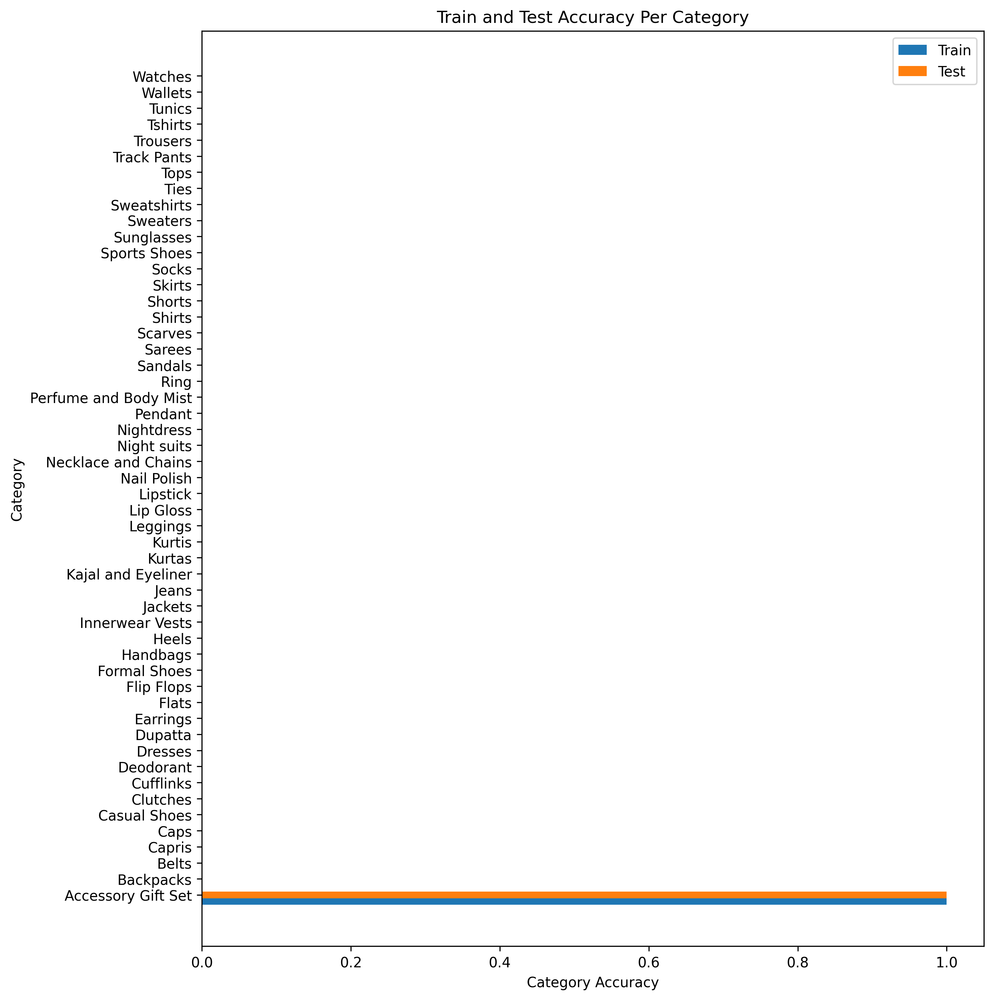

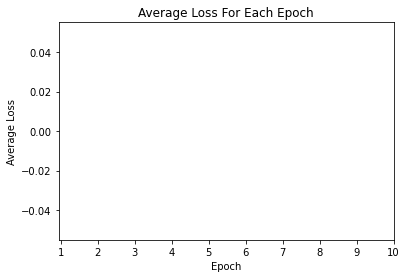

In [ ]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

## بخش ۴
در این بخش ابتدا با استفاده از تبدیل ToTensor داده‌ها را نرمالایز می‌کنیم.

In [18]:
transform = transforms.Compose([transforms.Grayscale(), transforms.ToTensor()])
dataset = ImageFolder( "/content/data",
                      transform=transform)

حال مجددا عمل تقسیم داده به دو مجموعه‌ی آموزش و تست را انجام می‌دهیم.

In [19]:
batch_size = 64

dataset_size = len(dataset)

train_indices = []
test_indices = []
test_split = .2
np.random.seed(42)
for i in range(dataset_size):
  split = int(np.floor(test_split * len(indices_by_classes[i])))
  train_indices.extend(indices_by_classes[i][split:])
  test_indices.extend(indices_by_classes[i][:split])
np.random.shuffle(train_indices)
np.random.shuffle(test_indices)

train_sampler = SubsetRandomSampler(train_indices)
test_sampler = SubsetRandomSampler(test_indices)

train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=train_sampler, num_workers=64)
test_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=test_sampler, num_workers=64)

مشاهده می‌شود که نتایج کاملاً متفاوتی از حالت قبل به دست می‌آید. پس نرمالایزکردن می‌تواند تاثیر بسزایی روی دقت یک مدل داشته باشد. البته هنوز هم در برخی از کلاس‌ها دچار دقت پایین و یا مسئله‌ی اورفیت‌شدن هستیم.

epoch 1, train_loss: 3.392, time elapsed: 45.138035 seconds
epoch 2, train_loss: 2.707, time elapsed: 44.971474 seconds
epoch 3, train_loss: 2.258, time elapsed: 45.652459 seconds
epoch 4, train_loss: 1.969, time elapsed: 45.667305 seconds
epoch 5, train_loss: 1.772, time elapsed: 45.118429 seconds
epoch 6, train_loss: 1.633, time elapsed: 45.25817 seconds
epoch 7, train_loss: 1.542, time elapsed: 45.273437 seconds
epoch 8, train_loss: 1.455, time elapsed: 44.655692 seconds
epoch 9, train_loss: 1.400, time elapsed: 45.639826 seconds
epoch 10, train_loss: 1.342, time elapsed: 45.129506 seconds
total training time: 7.542 minutes
-----------------------
Train Accuracy: %60.55
Test Accuracy:  %59.50
-----------------------


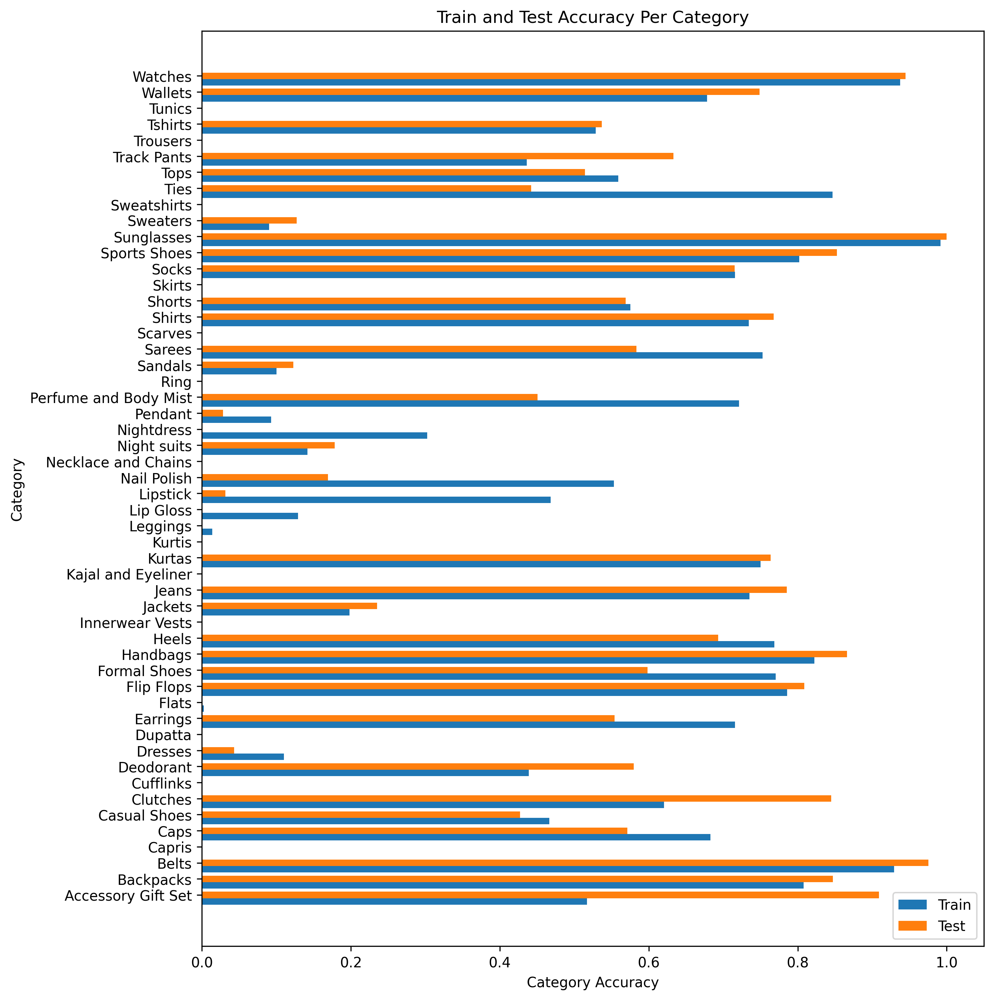

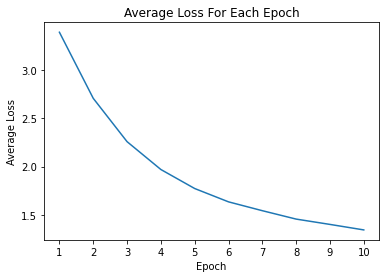

In [ ]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

## بخش ۵
### الف)
مشاهده می‌شود که دقت در این حالت بسیار کاهش می‌یابد و هم‌چنین میزان loss نیز کاهش بسیار کندی دارد. دلیل این امر آن است که وقتی تمامی وزن‌ها و بایاس‌ها صفر هستند، در نتیجه خروجی هر نورون صفر است و وقتی از back propagation استفاده می‌کنیم، خروجی نورون نیز در روابط استفاده‌شده ضرب می‌شود و در نتیجه به‌روزرسانی‌ها نیز مقدار صفر دارند و عملاً تغییری در وزن‌ها صورت نمی‌گیرد. همین مورد برای بایاس‌ها نیز توجیه‌پذیر است. در لایه‌ی آخر البته چون خروجی نورون‌ها می‌تواند یک باشد، پس بایاس آن‌ها قابل به‌روزرسانی است و فقط همین پارامترها در کل شبکه تغییر می‌کنند.

دلیل این‌که این مدل دقت ۹ درصدی کسب می‌کند نیز این امر است که دسته‌ای که بیشترین تعداد داده را دارد، بزرگترین خروجی نورون لایه آخر را تولید می‌کند که از ورودی مستقل است چون تمامی وزن‌ها صفر هستند. در نتیجه مدل تمامی داده‌ها را جزو آن دسته نمایش می‌دهد و دقت معادل نسب تعداد داده‌های آن دسته به کل داده‌ها می‌شود. 

epoch 1, train_loss: 3.891, time elapsed: 45.541424 seconds
epoch 2, train_loss: 3.778, time elapsed: 44.822368 seconds
epoch 3, train_loss: 3.664, time elapsed: 45.214208 seconds
epoch 4, train_loss: 3.558, time elapsed: 44.889003 seconds
epoch 5, train_loss: 3.495, time elapsed: 44.691545 seconds
epoch 6, train_loss: 3.471, time elapsed: 45.01832 seconds
epoch 7, train_loss: 3.461, time elapsed: 44.992866 seconds
epoch 8, train_loss: 3.457, time elapsed: 45.176092 seconds
epoch 9, train_loss: 3.454, time elapsed: 44.611211 seconds
epoch 10, train_loss: 3.453, time elapsed: 44.694463 seconds
total training time: 7.494 minutes
-----------------------
Train Accuracy: %9.48
Test Accuracy:  %9.50
-----------------------


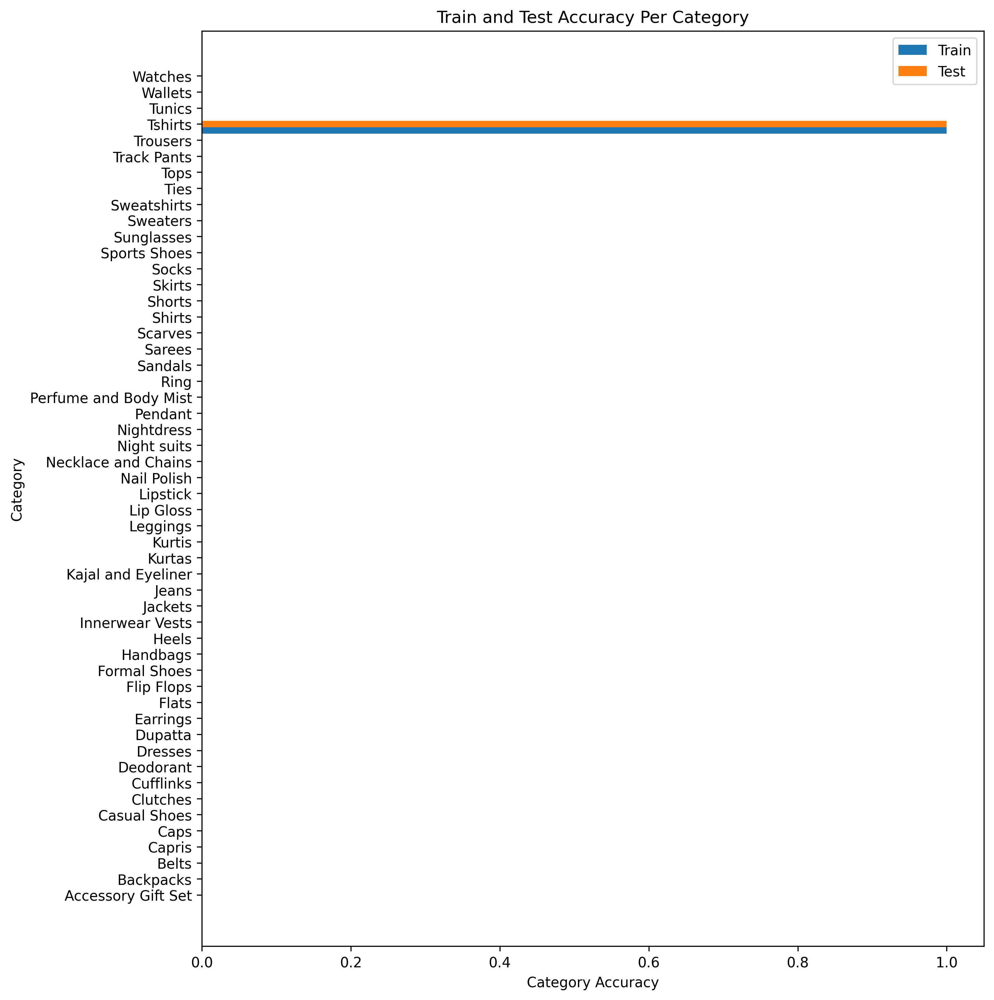

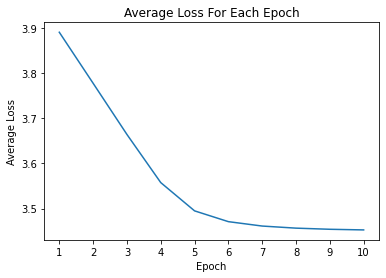

In [ ]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, zero_weights=True)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

### ب)
بهترین ترکیب اولیه‌ی وزن‌ها، انتخاب تصادفی آن‌هاست. دلیل آن هم این است که روش‌های مبتنی بر گرادیان، به‌شکل تصادفی نقاطی را برای شروع حرکت در تابع loss انتخاب کنند و در نتیجه روش‌های مختلفی برای رسیدن به مینیمم‌های محلی مختلف امتحان می‌شود و احتمال رسیدن به مینیمم‌های بهتر و نزدیک‌تر به پایین‌ترین نقطه، بالاتر است. 

## بخش ۶
### الف)
پس از امتحان‌کردن مقادیر ۰.۱، ۰.۰۰۱، ۰.۱۵، ۰.۰۵، ۰.۰۷۵ و ۰.۰۶۵، مقدار ۰.۰۷۵ بیشترین دقت یعنی ۶۵ درصد را به ما می‌دهد.

epoch 1, train_loss: 3.011, time elapsed: 44.794302 seconds
epoch 2, train_loss: 2.233, time elapsed: 45.797725 seconds
epoch 3, train_loss: 1.947, time elapsed: 44.824009 seconds
epoch 4, train_loss: 1.862, time elapsed: 44.781227 seconds
epoch 5, train_loss: 1.513, time elapsed: 44.880518 seconds
epoch 6, train_loss: 1.387, time elapsed: 44.285768 seconds
epoch 7, train_loss: 1.270, time elapsed: 45.075317 seconds
epoch 8, train_loss: 1.210, time elapsed: 44.455313 seconds
epoch 9, train_loss: 1.128, time elapsed: 45.65003 seconds
epoch 10, train_loss: 1.086, time elapsed: 44.497474 seconds
total training time: 7.484 minutes
-----------------------
Train Accuracy: %65.11
Test Accuracy:  %61.99
-----------------------


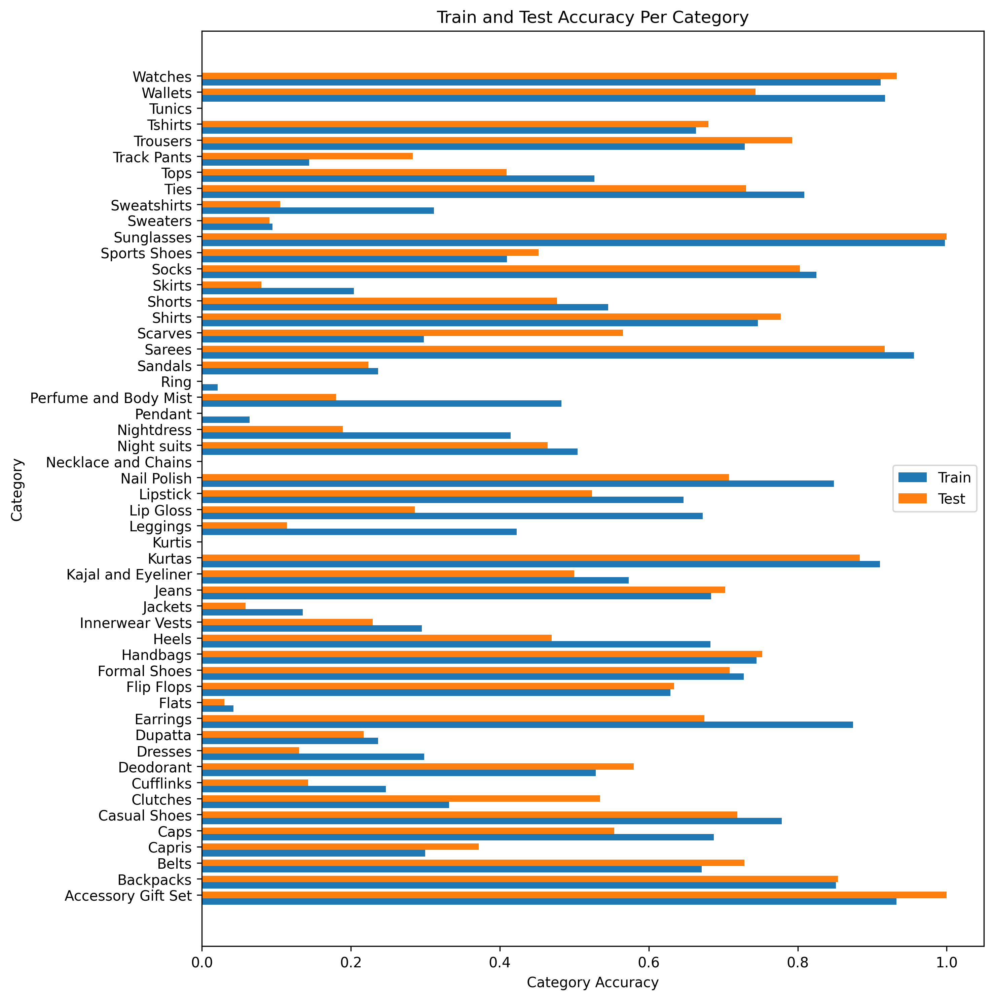

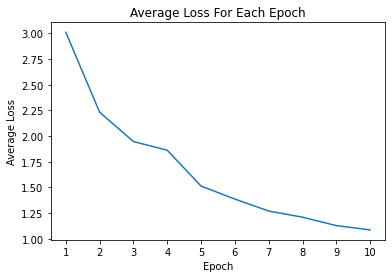

In [ ]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.1)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

epoch 1, train_loss: 3.868, time elapsed: 45.278644 seconds
epoch 2, train_loss: 3.561, time elapsed: 46.019547 seconds
epoch 3, train_loss: 3.452, time elapsed: 44.899707 seconds
epoch 4, train_loss: 3.430, time elapsed: 45.065873 seconds
epoch 5, train_loss: 3.410, time elapsed: 44.359008 seconds
epoch 6, train_loss: 3.377, time elapsed: 44.293199 seconds
epoch 7, train_loss: 3.319, time elapsed: 44.738702 seconds
epoch 8, train_loss: 3.214, time elapsed: 44.02429 seconds
epoch 9, train_loss: 3.078, time elapsed: 44.433478 seconds
epoch 10, train_loss: 2.960, time elapsed: 44.82976 seconds
total training time: 7.466 minutes
-----------------------
Train Accuracy: %22.65
Test Accuracy:  %22.14
-----------------------


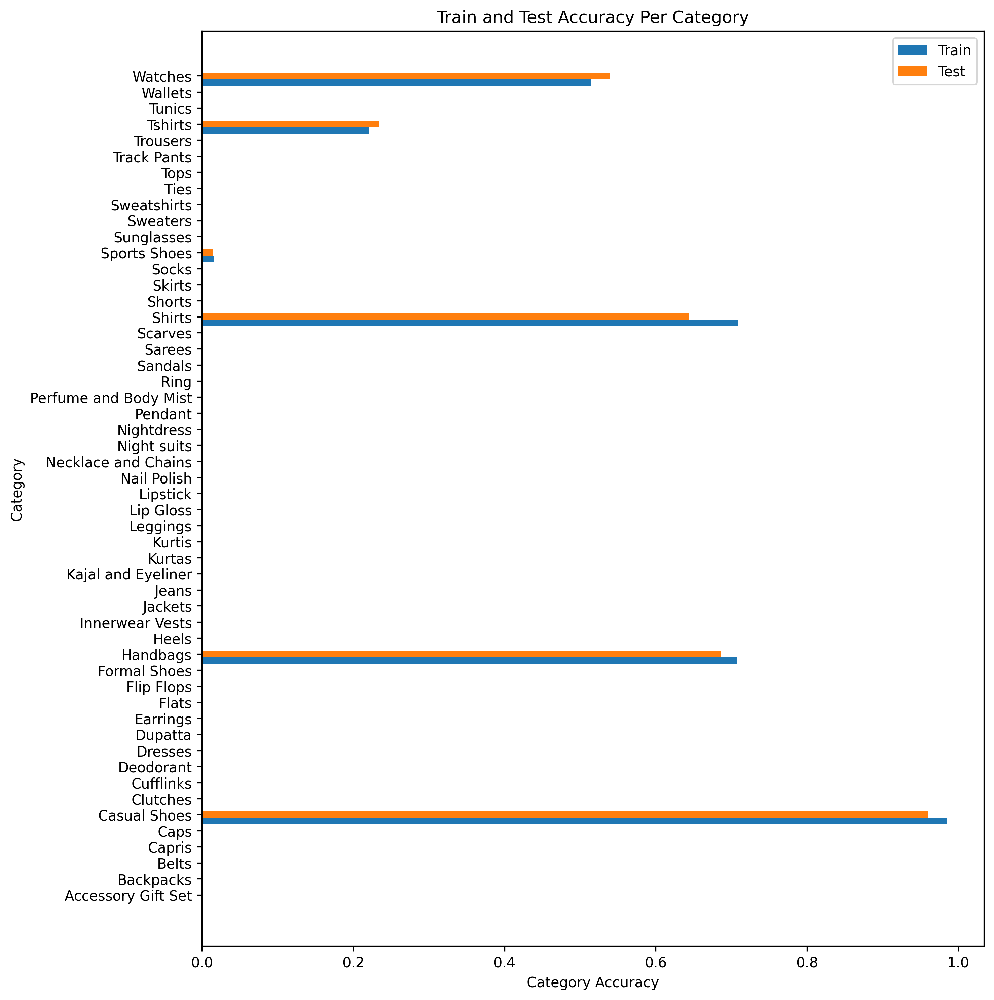

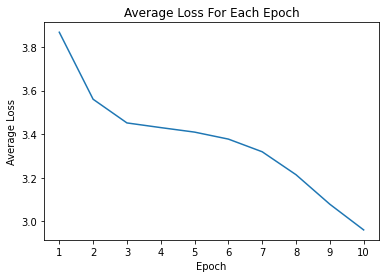

In [ ]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.001)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

epoch 1, train_loss: 3.391, time elapsed: 45.243157 seconds
epoch 2, train_loss: 2.903, time elapsed: 44.973179 seconds
epoch 3, train_loss: 2.716, time elapsed: 45.303008 seconds
epoch 4, train_loss: 2.370, time elapsed: 44.813679 seconds
epoch 5, train_loss: 2.145, time elapsed: 45.304584 seconds
epoch 6, train_loss: 1.880, time elapsed: 44.212272 seconds
epoch 7, train_loss: 1.662, time elapsed: 44.929431 seconds
epoch 8, train_loss: 1.686, time elapsed: 44.353312 seconds
epoch 9, train_loss: 1.480, time elapsed: 43.69902 seconds
epoch 10, train_loss: 1.387, time elapsed: 44.130339 seconds
total training time: 7.449 minutes
-----------------------
Train Accuracy: %50.60
Test Accuracy:  %49.75
-----------------------


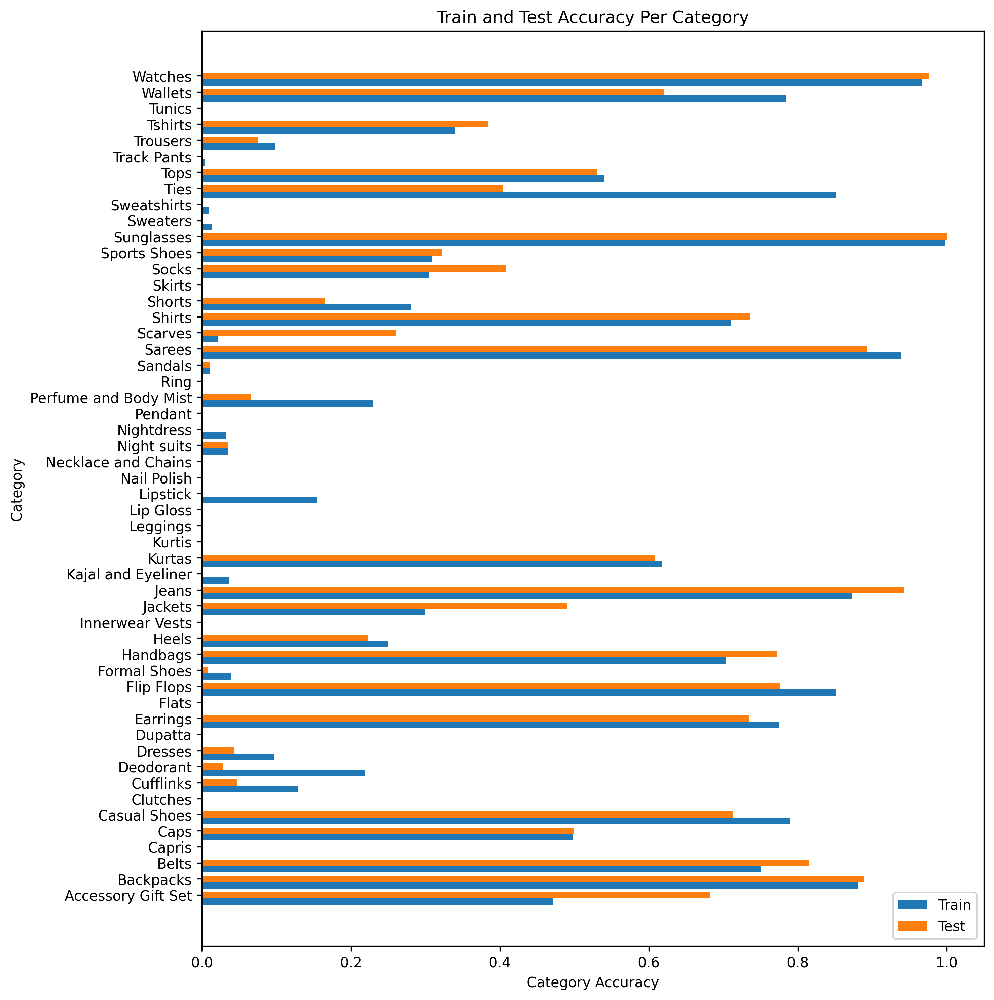

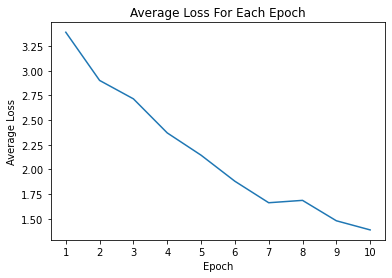

In [ ]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.15)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

epoch 1, train_loss: 2.815, time elapsed: 45.546008 seconds
epoch 2, train_loss: 2.015, time elapsed: 45.291867 seconds
epoch 3, train_loss: 1.687, time elapsed: 44.995307 seconds
epoch 4, train_loss: 1.478, time elapsed: 44.640795 seconds
epoch 5, train_loss: 1.344, time elapsed: 45.114713 seconds
epoch 6, train_loss: 1.261, time elapsed: 46.4172 seconds
epoch 7, train_loss: 1.196, time elapsed: 44.871048 seconds
epoch 8, train_loss: 1.126, time elapsed: 44.921768 seconds
epoch 9, train_loss: 1.056, time elapsed: 45.216004 seconds
epoch 10, train_loss: 1.023, time elapsed: 44.428285 seconds
total training time: 7.524 minutes
-----------------------
Train Accuracy: %67.71
Test Accuracy:  %64.65
-----------------------


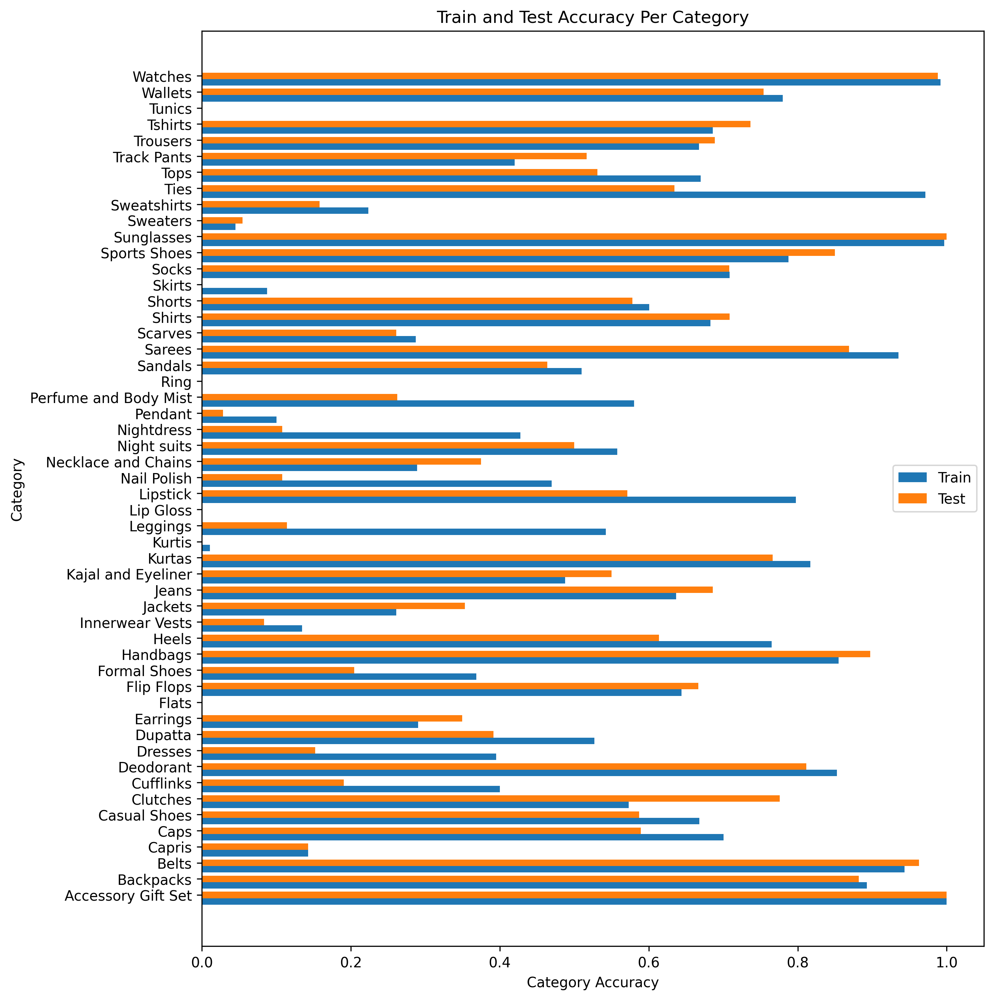

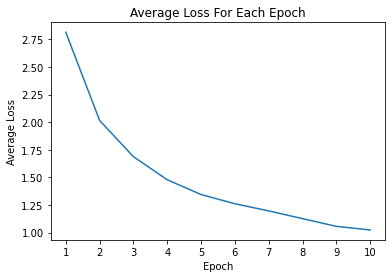

In [ ]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.05)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

epoch 1, train_loss: 2.903, time elapsed: 44.579921 seconds
epoch 2, train_loss: 2.085, time elapsed: 44.855346 seconds
epoch 3, train_loss: 1.740, time elapsed: 44.579954 seconds
epoch 4, train_loss: 1.500, time elapsed: 44.576879 seconds
epoch 5, train_loss: 1.385, time elapsed: 45.427127 seconds
epoch 6, train_loss: 1.268, time elapsed: 44.326826 seconds
epoch 7, train_loss: 1.197, time elapsed: 43.670673 seconds
epoch 8, train_loss: 1.121, time elapsed: 44.193725 seconds
epoch 9, train_loss: 1.066, time elapsed: 43.951221 seconds
epoch 10, train_loss: 1.007, time elapsed: 44.235973 seconds
total training time: 7.407 minutes
-----------------------
Train Accuracy: %69.22
Test Accuracy:  %65.69
-----------------------


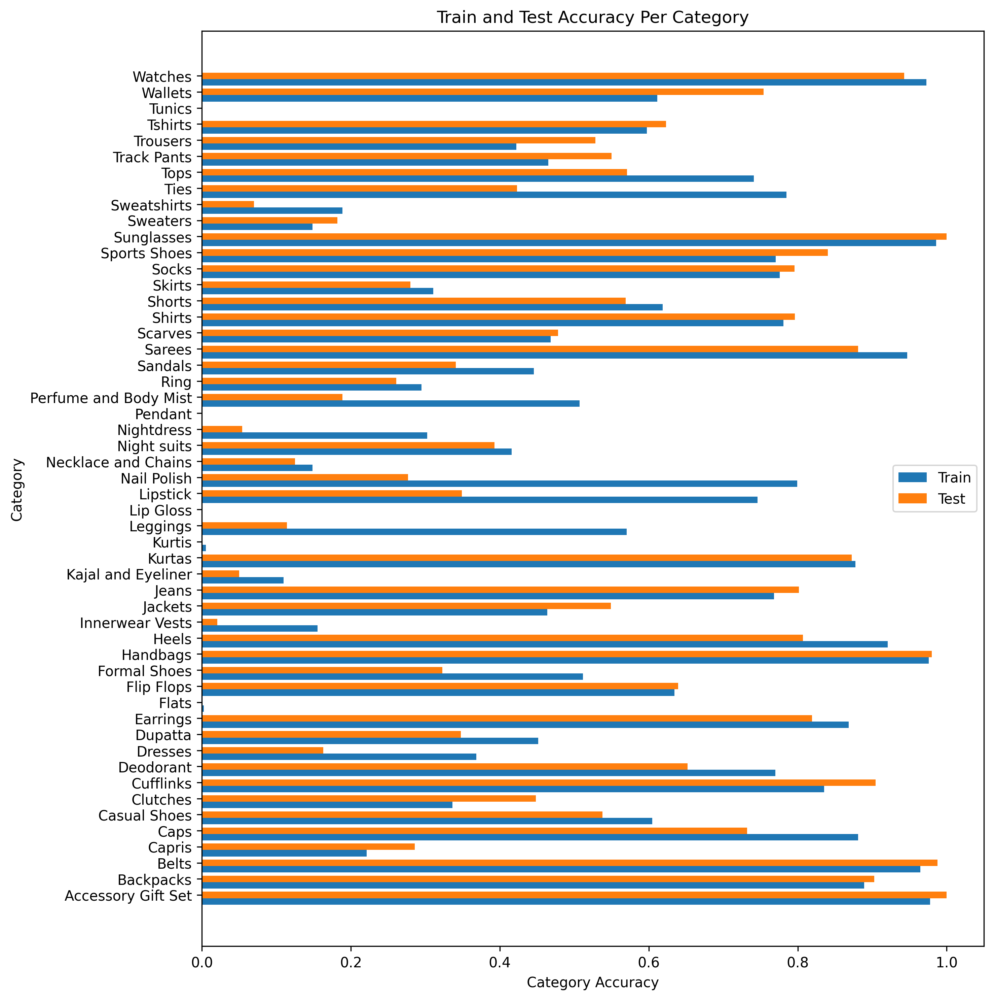

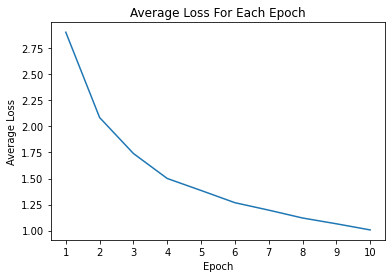

In [ ]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.075)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

epoch 1, train_loss: 2.852, time elapsed: 44.634409 seconds
epoch 2, train_loss: 2.088, time elapsed: 44.01181 seconds
epoch 3, train_loss: 1.743, time elapsed: 43.503423 seconds
epoch 4, train_loss: 1.521, time elapsed: 43.714957 seconds
epoch 5, train_loss: 1.365, time elapsed: 43.494894 seconds
epoch 6, train_loss: 1.274, time elapsed: 43.271333 seconds
epoch 7, train_loss: 1.205, time elapsed: 43.905306 seconds
epoch 8, train_loss: 1.127, time elapsed: 44.085689 seconds
epoch 9, train_loss: 1.066, time elapsed: 43.50552 seconds
epoch 10, train_loss: 1.023, time elapsed: 44.471617 seconds
total training time: 7.310 minutes
-----------------------
Train Accuracy: %66.87
Test Accuracy:  %63.63
-----------------------


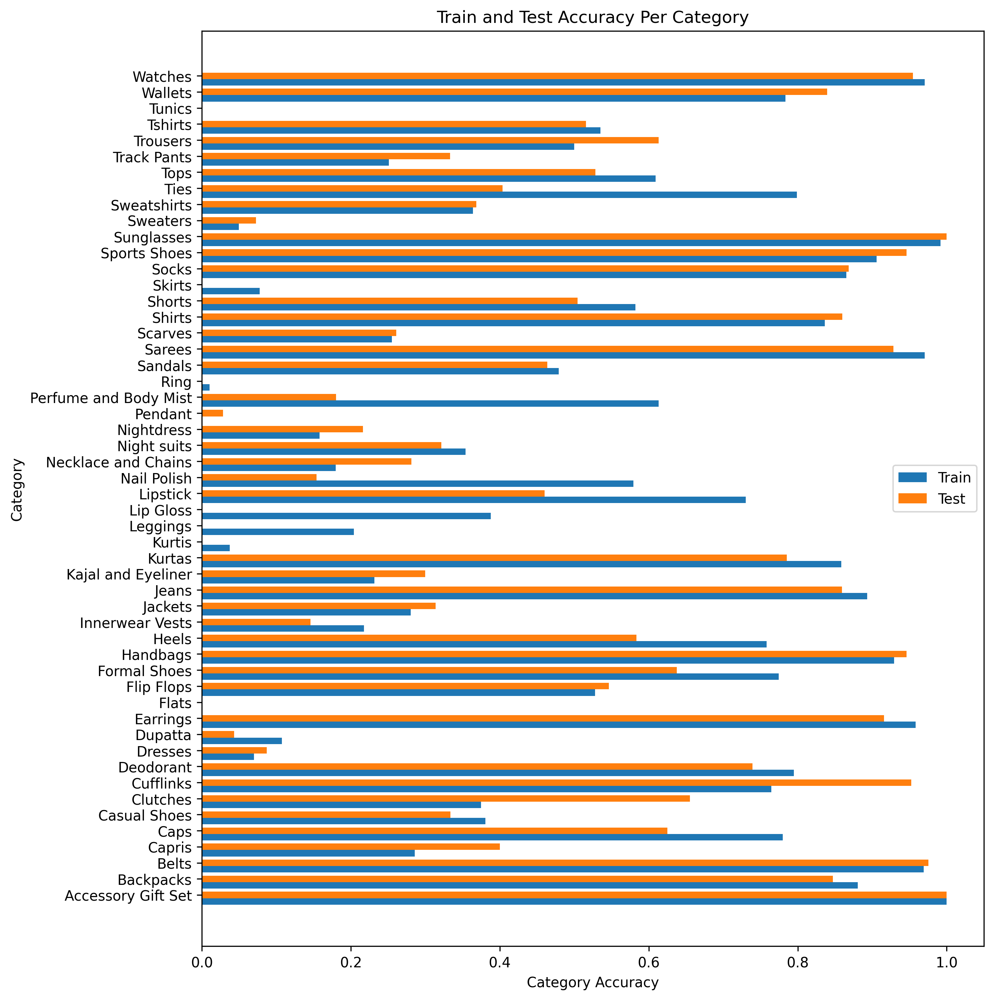

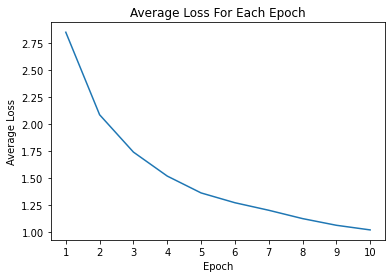

In [ ]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.065)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

### ب)
در نرخ یادگیری بالاتر، دقت کمی کاهش پیدا کرده است و در نرخ یادگیری پایین‌تر این مقدار کاهش چشم‌گیری پیدا کرده است. هرچه این نرخ بالاتر باشد، مقداری که وزن‌ها تغییر می‌کنند بیشتر می‌شود و در نتیجه سرعت حرکت روی تابع خطا بالاتر می‌رود، اما این باعث می‌شود که قدم‌ها بلند باشند و مینیمم‌ها از دست بروند و حرکت نیمه تصادفی باشد. برای نرخ خیلی پایین نیز چون میزان تغییرات وزن‌ها و حرکت روی تابع خطا بسیار کند و با قدم‌های خیلی ریز است، سرعت نزدیک‌شدن به مینیمم نیز بسیار پایین است و در نتیجه برای این‌که به مینیمم برسیم باید epochهای بسیاری سپری شود که همین امر موجب افزایش زمان موردنیاز برای یادگیری مدل می‌شود. عیب نرخ خیلی بالا نیز این است که حرکت‌ها بسیار بزرگ خواهند بود و ممکن است پرش از روی مینیمم‌ها رخ دهد. 

## بخش ۷
### الف)
مشاهده می‌شود که برای مقدار ۳۲، دقت تفاوت چندانی ندارد ولی از میزان loss هر مرحله کمی کاسته شده است. برای مقدار ۱۲۸ اما مقدار کمی کاهش در دقت رخ داده است و هم‌چنین میزان loss نیز افزایش قابل توجهی داشته است.

سایز بسیار کوچک می‌تواند منجر به افزایش زمان یادگیری شود و البته باعث افزایش دقت هم خواهد شد چون در قدم‌های بیشتر به سمت مینیمم حرکت می‌کنیم و شانس رسیدن به مینیمم گلوبال افزایش می‌یابد. البته برعکس همین موضوع هم ممکن است رخ دهد و این مسئله بستگی به فاکتورهای مختلفی دارد. هم‌چنین ممکن است یادگیری بسیار تصادفی باشد، چون دسته‌ها بسیار کوچک هستند و در فرآیند یادگیری و محاسبه‌ی گرادیان‌ها فقط چند تصویر دیده می‌شود. در سایز بالا هم گرادیان‌های دقیق‌تری خواهیم داشت چون تعداد تصاویر هر دسته بیشتر است. از طرفی اما تعداد به‌روزرسانی‌ها کم‌تر است و در نتیجه انتخاب بین سایز بالاتر و پایین‌تر یک تریدآف بین به‌روزرسانی‌های بدِ زیاد و به‌روزرسانی‌های خوبِ کم است.

epoch 1, train_loss: 2.577, time elapsed: 47.343311 seconds
epoch 2, train_loss: 1.788, time elapsed: 47.055536 seconds
epoch 3, train_loss: 1.487, time elapsed: 47.133285 seconds
epoch 4, train_loss: 1.335, time elapsed: 46.880123 seconds
epoch 5, train_loss: 1.214, time elapsed: 46.788365 seconds
epoch 6, train_loss: 1.127, time elapsed: 46.617743 seconds
epoch 7, train_loss: 1.052, time elapsed: 46.083027 seconds
epoch 8, train_loss: 0.991, time elapsed: 46.81781 seconds
epoch 9, train_loss: 0.955, time elapsed: 46.758347 seconds
epoch 10, train_loss: 0.900, time elapsed: 46.592206 seconds
total training time: 7.801 minutes
-----------------------
Train Accuracy: %69.38
Test Accuracy:  %65.00
-----------------------


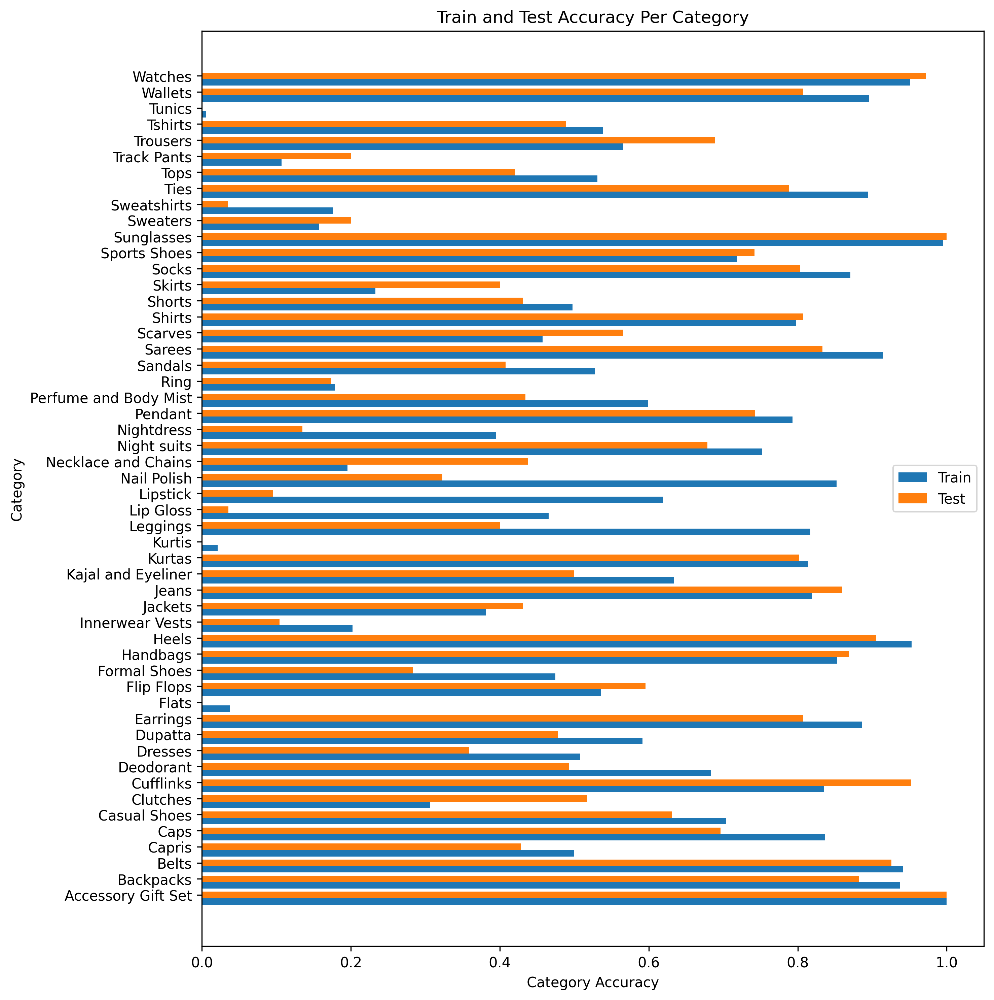

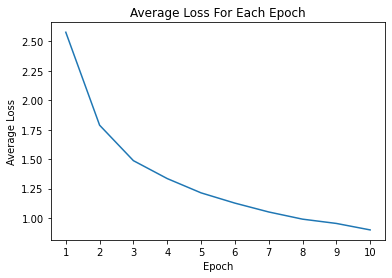

In [ ]:
batch_size = 32
train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=train_sampler, num_workers=64)
test_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=test_sampler, num_workers=64)
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.075)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

epoch 1, train_loss: 3.112, time elapsed: 30.327143 seconds
epoch 2, train_loss: 2.353, time elapsed: 30.956928 seconds
epoch 3, train_loss: 2.078, time elapsed: 30.221875 seconds
epoch 4, train_loss: 1.812, time elapsed: 30.59594 seconds
epoch 5, train_loss: 1.650, time elapsed: 29.920081 seconds
epoch 6, train_loss: 1.517, time elapsed: 29.78026 seconds
epoch 7, train_loss: 1.403, time elapsed: 29.860908 seconds
epoch 8, train_loss: 1.321, time elapsed: 29.914124 seconds
epoch 9, train_loss: 1.265, time elapsed: 29.727998 seconds
epoch 10, train_loss: 1.200, time elapsed: 30.097582 seconds
total training time: 5.023 minutes
-----------------------
Train Accuracy: %64.52
Test Accuracy:  %62.69
-----------------------


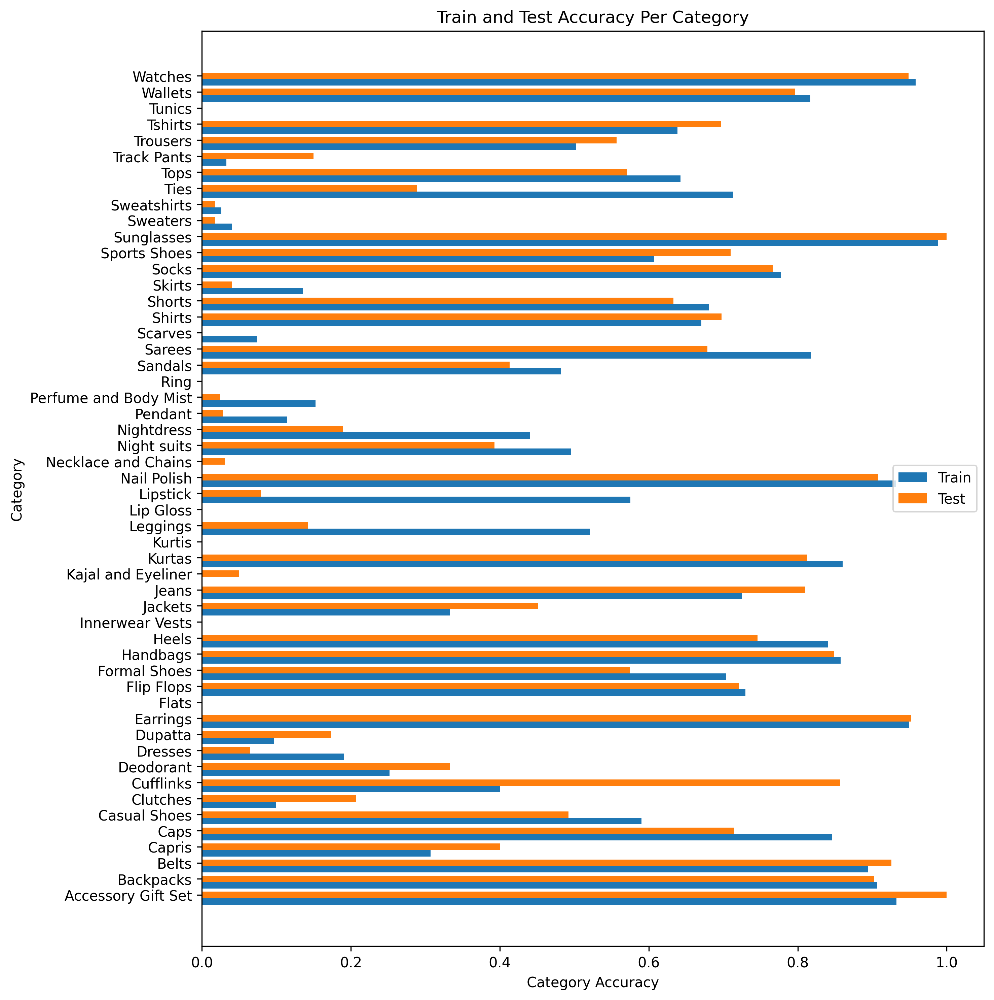

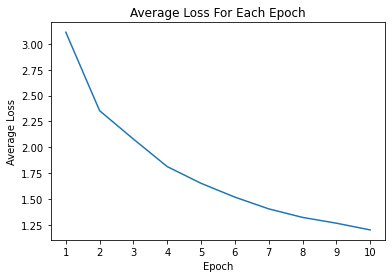

In [20]:
batch_size = 128
train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=train_sampler, num_workers=64)
test_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=test_sampler, num_workers=64)
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.075)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

### ب)
با کاهش نرخ یادگیری، دقت هم کاهش می‌یابد چرا که حالا تعداد به‌روزرسانی‌ها کم‌تر شده و عملاً باید با نرخ بالاتری باید یادگیری انجام شود. در نتیجه بهتر است که از نرخ بالاتری استفاده کنیم تا کاهش تعداد به‌روزرسانی‌ها را جبران کند. در واقع وقتی سایز batch بزرگتر می‌شود، با اطمینان بیشتری به سمت مینیمم حرکت می‌کنیم و در نتیجه می‌توانیم تا حد معقولی نرخ یادگیری را هم بالا ببریم. 

epoch 1, train_loss: 3.557, time elapsed: 30.913955 seconds
epoch 2, train_loss: 3.221, time elapsed: 30.247147 seconds
epoch 3, train_loss: 2.817, time elapsed: 30.23431 seconds
epoch 4, train_loss: 2.591, time elapsed: 30.543605 seconds
epoch 5, train_loss: 2.351, time elapsed: 29.989061 seconds
epoch 6, train_loss: 2.139, time elapsed: 29.936307 seconds
epoch 7, train_loss: 1.966, time elapsed: 30.195263 seconds
epoch 8, train_loss: 1.843, time elapsed: 30.172543 seconds
epoch 9, train_loss: 1.749, time elapsed: 30.032381 seconds
epoch 10, train_loss: 1.685, time elapsed: 31.017543 seconds
total training time: 5.055 minutes
-----------------------
Train Accuracy: %42.87
Test Accuracy:  %42.78
-----------------------


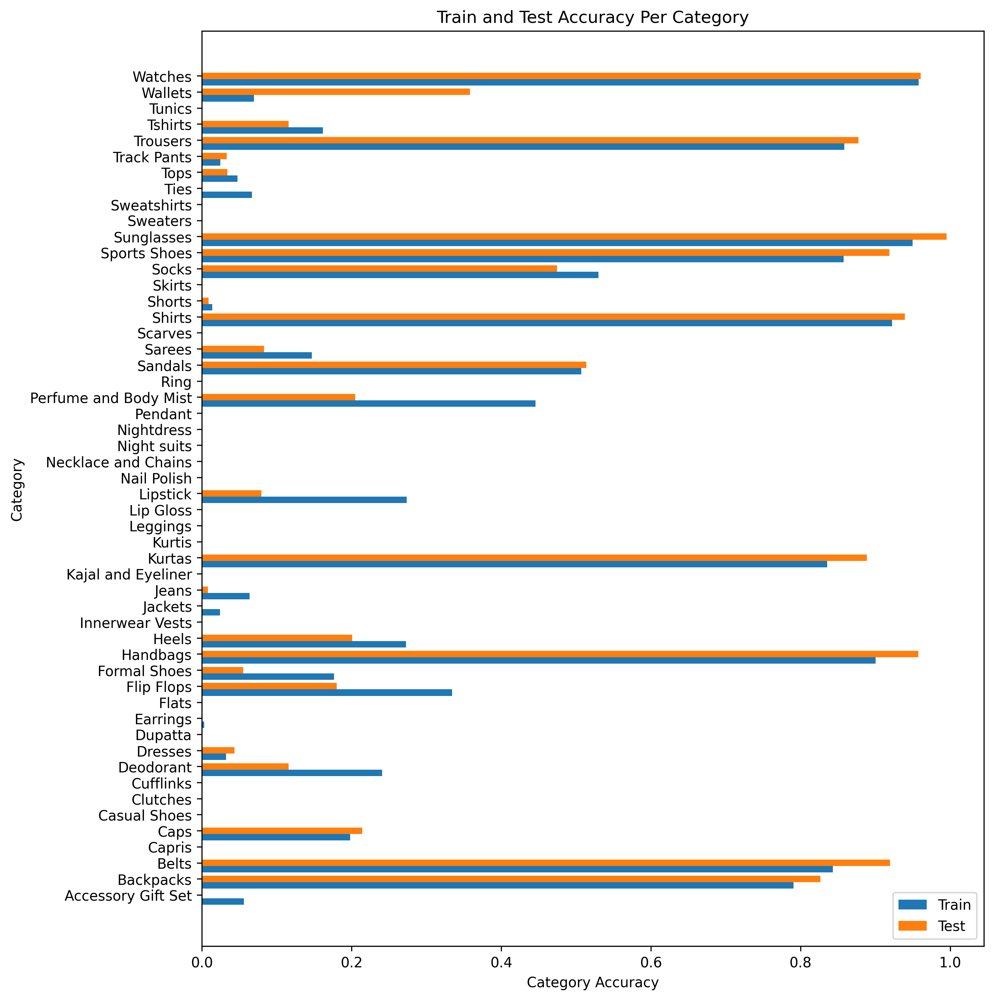

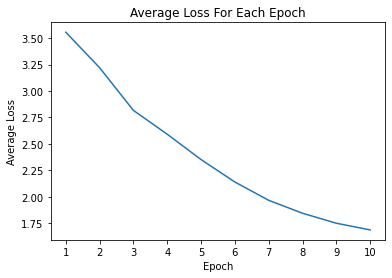

In [21]:
batch_size = 128
train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=train_sampler, num_workers=64)
test_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=test_sampler, num_workers=64)
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.01)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

epoch 1, train_loss: 3.171, time elapsed: 30.213447 seconds
epoch 2, train_loss: 2.484, time elapsed: 29.83419 seconds
epoch 3, train_loss: 2.125, time elapsed: 29.992225 seconds
epoch 4, train_loss: 1.868, time elapsed: 30.030183 seconds
epoch 5, train_loss: 1.693, time elapsed: 29.929295 seconds
epoch 6, train_loss: 1.535, time elapsed: 30.12552 seconds
epoch 7, train_loss: 1.429, time elapsed: 29.943069 seconds
epoch 8, train_loss: 1.357, time elapsed: 30.773168 seconds
epoch 9, train_loss: 1.281, time elapsed: 30.167497 seconds
epoch 10, train_loss: 1.241, time elapsed: 30.549709 seconds
total training time: 5.026 minutes
-----------------------
Train Accuracy: %63.96
Test Accuracy:  %61.85
-----------------------


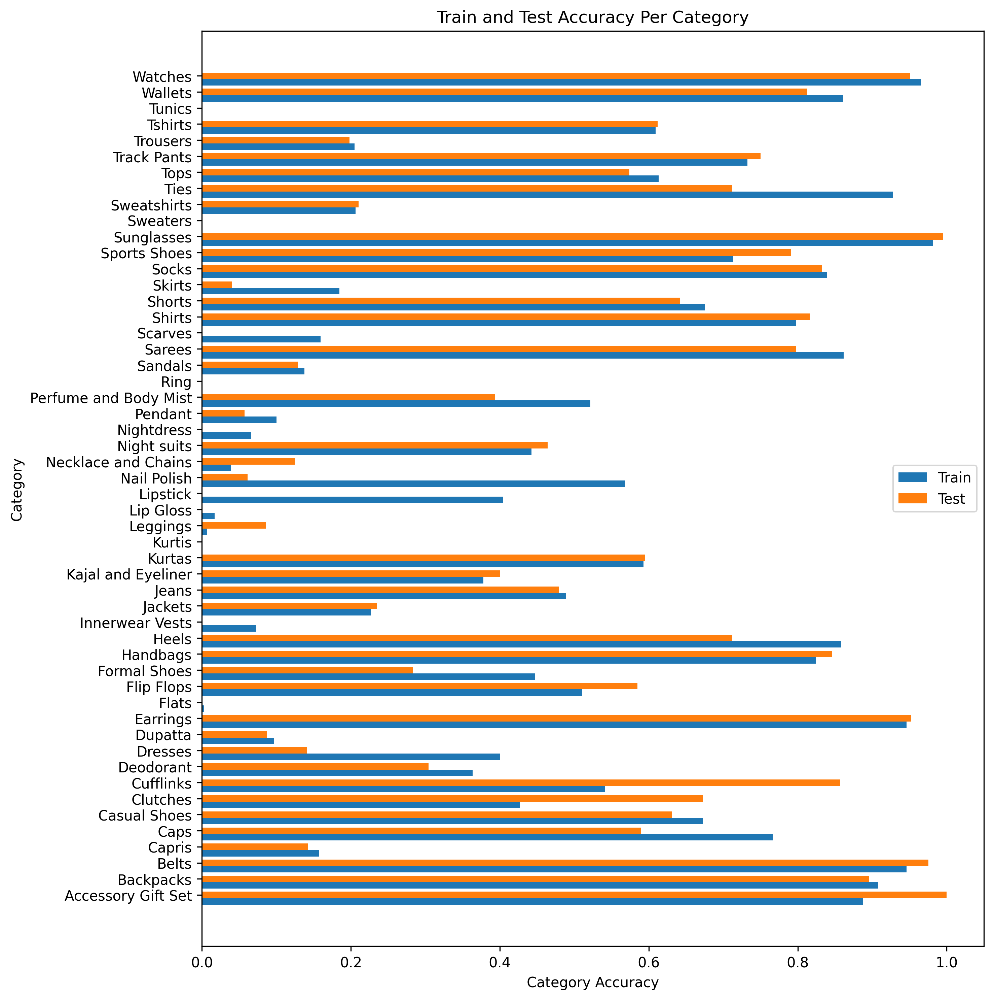

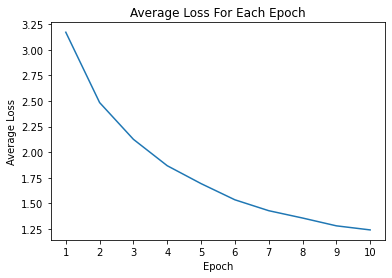

In [22]:
batch_size = 128
train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=train_sampler, num_workers=64)
test_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=test_sampler, num_workers=64)
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.1)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

## بخش ۸
### الف)
وقتی روی تابع خطا پیمایش انجام می‌شود، مقدار و علامت مشتق‌ها تغییرات زیادی می‌کند  و ممکن است رسیدن به مینیمم گلوبال کار آسانی نباشد. وقتی پارامتر momentum را اضافه می‌کنیم، به جای این‌که فقط به مقدار گرادیان در یک نقطه‌ی خاص وابسته باشیم، حرکتمان حالا به اندازه و جهت حرکت‌های قبلی هم وابسته می‌شود و در واقع به‌روزرسانی قبلی در این پارامتر ضرب شده و با گرادیان فعلی جمع می‌شود. به همین ترتیب از آن‌جا که حرکت قبلی نیز به حرکت قبلی خودش وابسته بوده، بدین شکل هر حرکت به کل تاریخچه‌ی حرکات وابسته خواهد بود و این‌گونه بهتر به سمت مینیمم گلوبال یا مینیمم‌های محلی بهتر حرکت خواهیم کرد. اگر این پارامتر به درستی انتخاب نشود هم ممکن است یادگیری با مشکل مواجه شود و یا کند شود. 

### ب)
همان‌گونه که در ادامه دیده می‌شود در تمامی این مقادیر، دقت نسبت به حالتی که تکانه صفر است، کاهش یافته است. دلیل این امر می‌تواند این باشد که میزان learning rate انتخاب‌شده در مراحل قبل نسبتاً بالا است و این باعث می‌شود که جمع اثر نرخ یادگیری و تکانه زیاد شود و در واقع قدم‌های حرکت بزرگ باشند و از روی مینیمم‌ها پرش صورت بگیرد. در نتیجه تکانه‌ی صفر به‌عنوان تکانه‌ی بهینه در نظر گرفته می‌شود.

در مقدار تکانه‌ی ۰.۹ و ۰.۹۸ نیز چون مقادیر بزرگی نسبت به learning rate انتخاب شده‌اند، روند یادگیری مختل می‌شود و میزان خطا نیز بسیار زیاد شده و تبدیل به nan می‌شود. در نتیجه دقت این مدل‌ها نیز تقریبا صفر خواهد بود.

### پ)
خیر. همان‌طور که دیده شد و توضیح داده شد، تکانه‌ی بالا می‌تواند باعث پرش از روی مینیمم‌ها شود و در نتیجه دقت کاهش پیدا کند. پس این امر نیاز به این دارد که در کنار آن، learning rate نیز به‌درستی تنظیم شود.

epoch 1, train_loss: 3.126, time elapsed: 30.988819 seconds
epoch 2, train_loss: 2.524, time elapsed: 30.538445 seconds
epoch 3, train_loss: 1.902, time elapsed: 30.96539 seconds
epoch 4, train_loss: 1.652, time elapsed: 30.652301 seconds
epoch 5, train_loss: 1.493, time elapsed: 31.165359 seconds
epoch 6, train_loss: 1.370, time elapsed: 31.050119 seconds
epoch 7, train_loss: 1.225, time elapsed: 30.857528 seconds
epoch 8, train_loss: 1.177, time elapsed: 30.851064 seconds
epoch 9, train_loss: 1.118, time elapsed: 31.344986 seconds
epoch 10, train_loss: 1.050, time elapsed: 31.006942 seconds
total training time: 5.157 minutes
-----------------------
Train Accuracy: %63.47
Test Accuracy:  %60.47
-----------------------


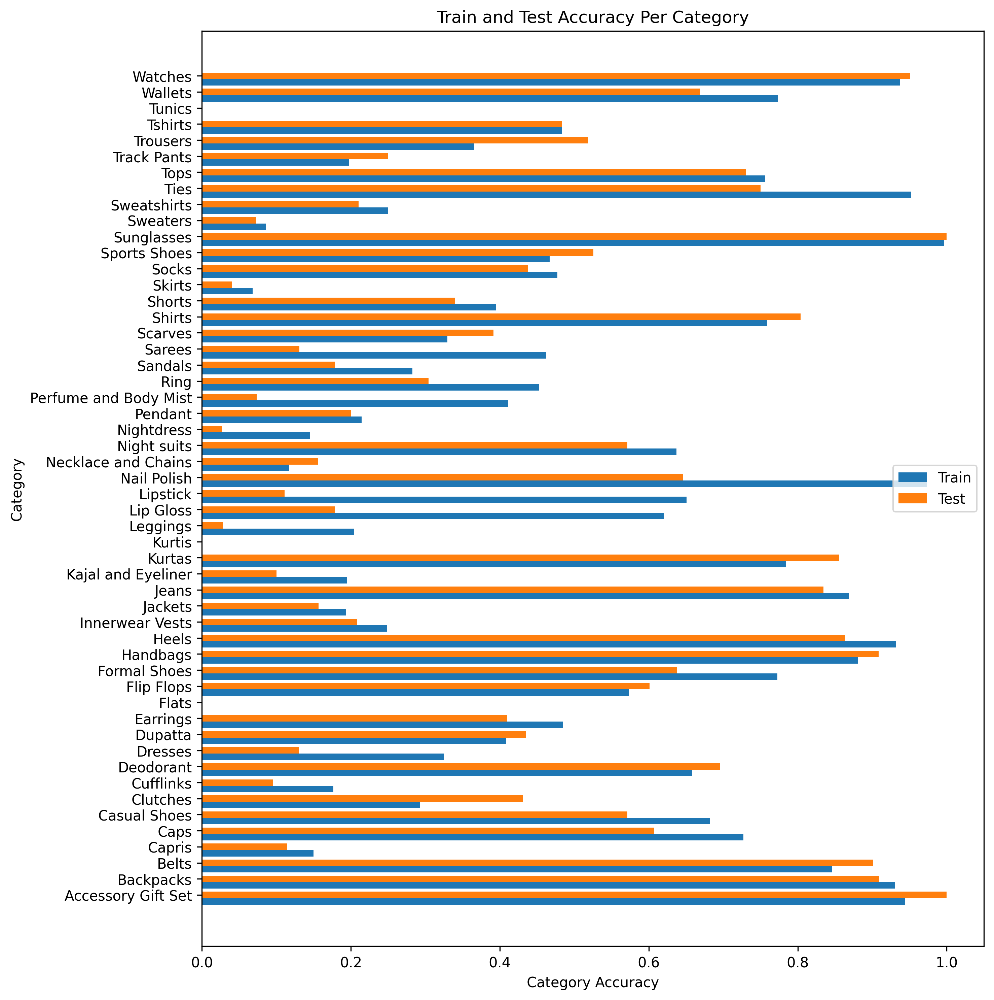

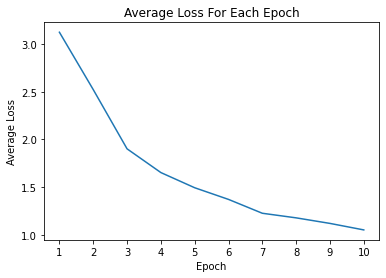

In [23]:
batch_size = 64
train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=train_sampler, num_workers=64)
test_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, sampler=test_sampler, num_workers=64)
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.075, momentum=0.5)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

epoch 1, train_loss: 2.981, time elapsed: 30.719859 seconds
epoch 2, train_loss: 3.287, time elapsed: 30.712316 seconds
epoch 3, train_loss: 3.063, time elapsed: 30.57668 seconds
epoch 4, train_loss: 3.463, time elapsed: 30.899815 seconds
epoch 5, train_loss: 3.115, time elapsed: 30.744198 seconds
epoch 6, train_loss: nan, time elapsed: 30.92407 seconds
epoch 7, train_loss: nan, time elapsed: 31.593179 seconds
epoch 8, train_loss: nan, time elapsed: 30.657381 seconds
epoch 9, train_loss: nan, time elapsed: 31.044709 seconds
epoch 10, train_loss: nan, time elapsed: 30.669053 seconds
total training time: 5.142 minutes
-----------------------
Train Accuracy: %0.30
Test Accuracy:  %0.30
-----------------------


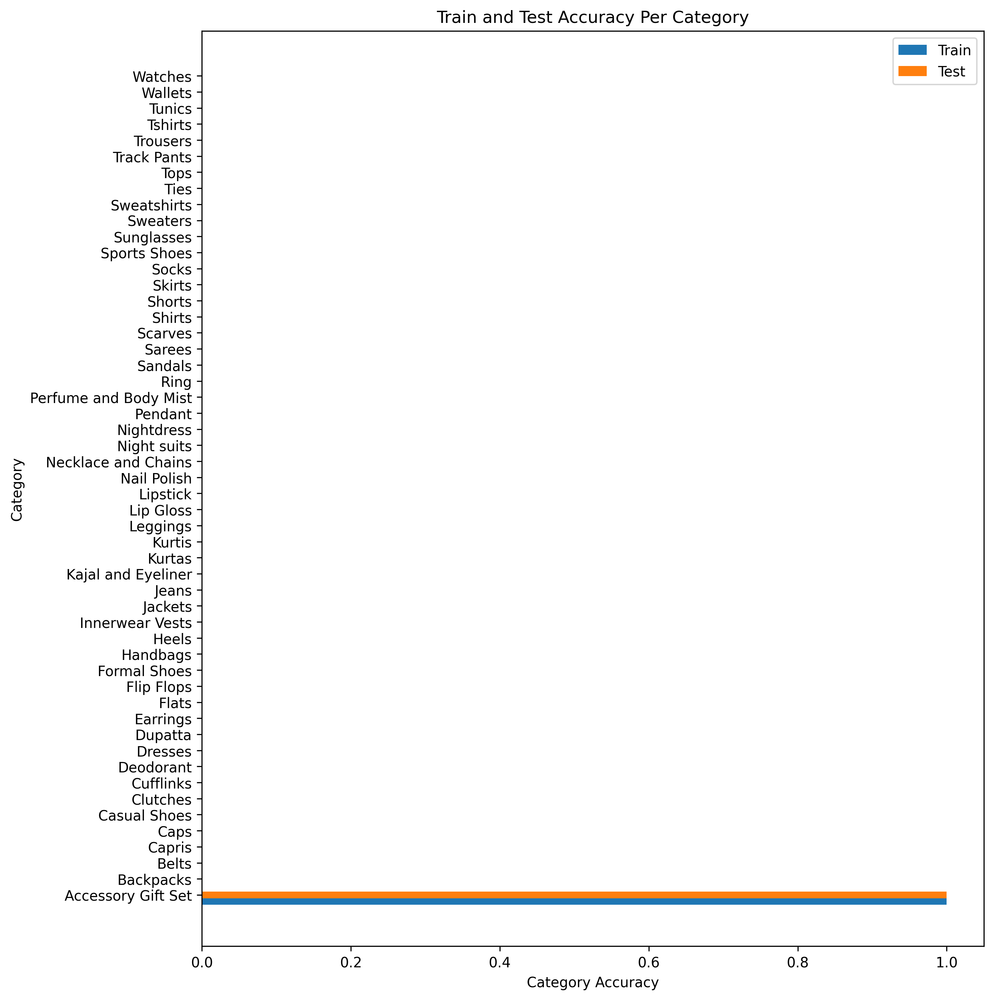

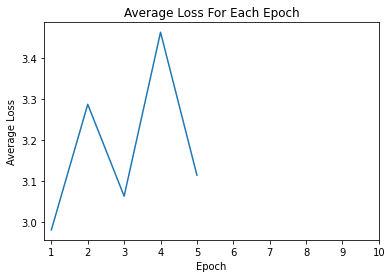

In [24]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.075, momentum=0.9)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

epoch 1, train_loss: nan, time elapsed: 30.928683 seconds
epoch 2, train_loss: nan, time elapsed: 30.980855 seconds
epoch 3, train_loss: nan, time elapsed: 30.901702 seconds
epoch 4, train_loss: nan, time elapsed: 30.715336 seconds
epoch 5, train_loss: nan, time elapsed: 30.651992 seconds
epoch 6, train_loss: nan, time elapsed: 31.331583 seconds
epoch 7, train_loss: nan, time elapsed: 30.889955 seconds
epoch 8, train_loss: nan, time elapsed: 30.492584 seconds
epoch 9, train_loss: nan, time elapsed: 30.890433 seconds
epoch 10, train_loss: nan, time elapsed: 30.545438 seconds
total training time: 5.139 minutes
-----------------------
Train Accuracy: %0.30
Test Accuracy:  %0.30
-----------------------


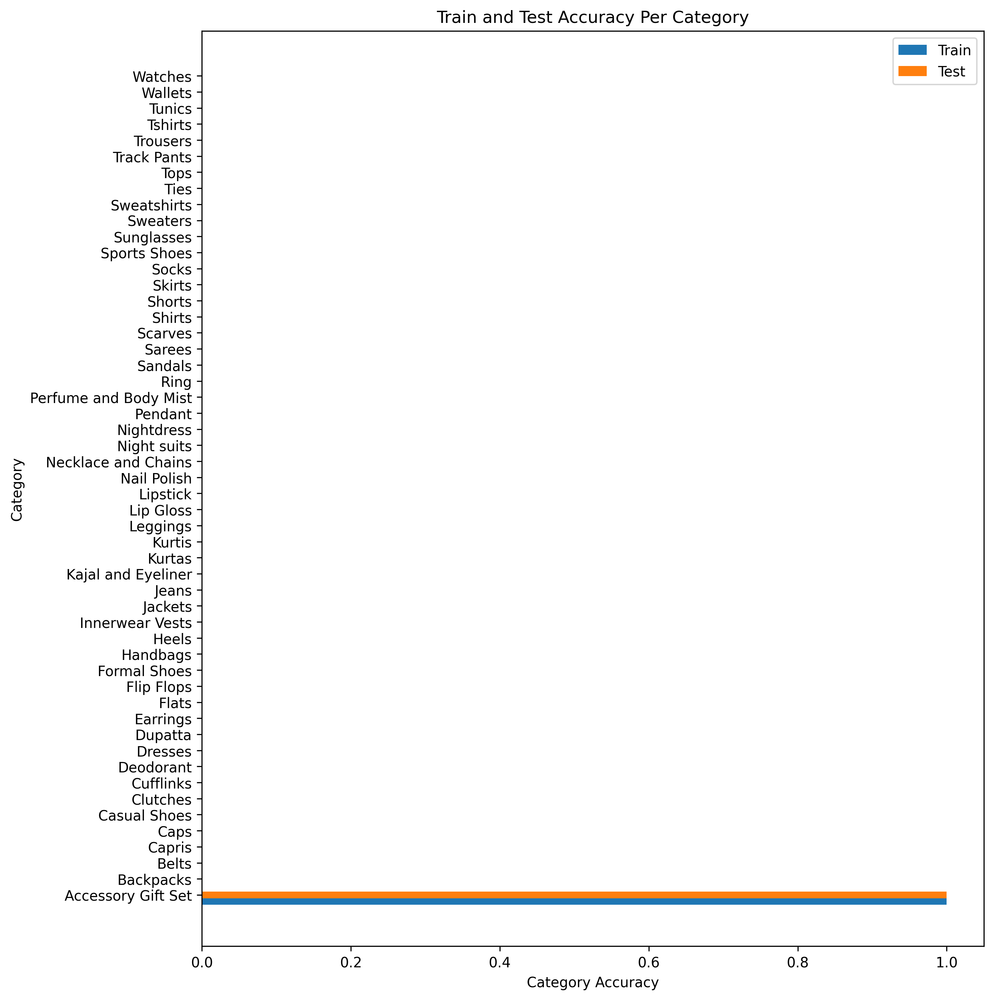

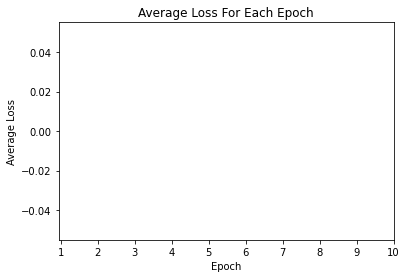

In [25]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.075, momentum=0.98)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

## بخش ۹
### الف)
با تغییر تعداد epochها، مشاهده می‌شود که دقت افزایش یافته و میزان loss نیز نسبت به مدل‌های پیشین کاهش بیشتری دارد.

### ب)
به‌طور کلی برای افزایش دقت شبکه و هم‌چنین افزایش تعداد دفعات به‌روزرسانی وزن‌ها این کار انجام می‌شود که می‌تواند در روند یادگیری اثر مثبت داشته باشد و در واقع یک فرآیند فیدبکی پشت سر گذاشته شود تا به بهترین وضعیت که یعنی کم‌ترین میزان loss است برسیم.

### پ)
خیر. اگر تعداد epochها زیاد از حد شود، می‌تواند به بروز overfitting بیانجامد که یعنی دقت در داده‌های تست کاهش خواهد یافت.

epoch 1, train_loss: 2.829, time elapsed: 31.831884 seconds
epoch 2, train_loss: 2.051, time elapsed: 31.546049 seconds
epoch 3, train_loss: 1.726, time elapsed: 32.168045 seconds
epoch 4, train_loss: 1.490, time elapsed: 31.819186 seconds
epoch 5, train_loss: 1.364, time elapsed: 31.654858 seconds
epoch 6, train_loss: 1.249, time elapsed: 31.619897 seconds
epoch 7, train_loss: 1.182, time elapsed: 31.871355 seconds
epoch 8, train_loss: 1.119, time elapsed: 31.550697 seconds
epoch 9, train_loss: 1.054, time elapsed: 31.948361 seconds
epoch 10, train_loss: 1.004, time elapsed: 31.347321 seconds
epoch 11, train_loss: 0.969, time elapsed: 31.262481 seconds
epoch 12, train_loss: 0.929, time elapsed: 31.125736 seconds
epoch 13, train_loss: 0.893, time elapsed: 31.929832 seconds
epoch 14, train_loss: 0.863, time elapsed: 31.589331 seconds
epoch 15, train_loss: 0.842, time elapsed: 31.287145 seconds
epoch 16, train_loss: 0.815, time elapsed: 31.170139 seconds
epoch 17, train_loss: 0.798, time

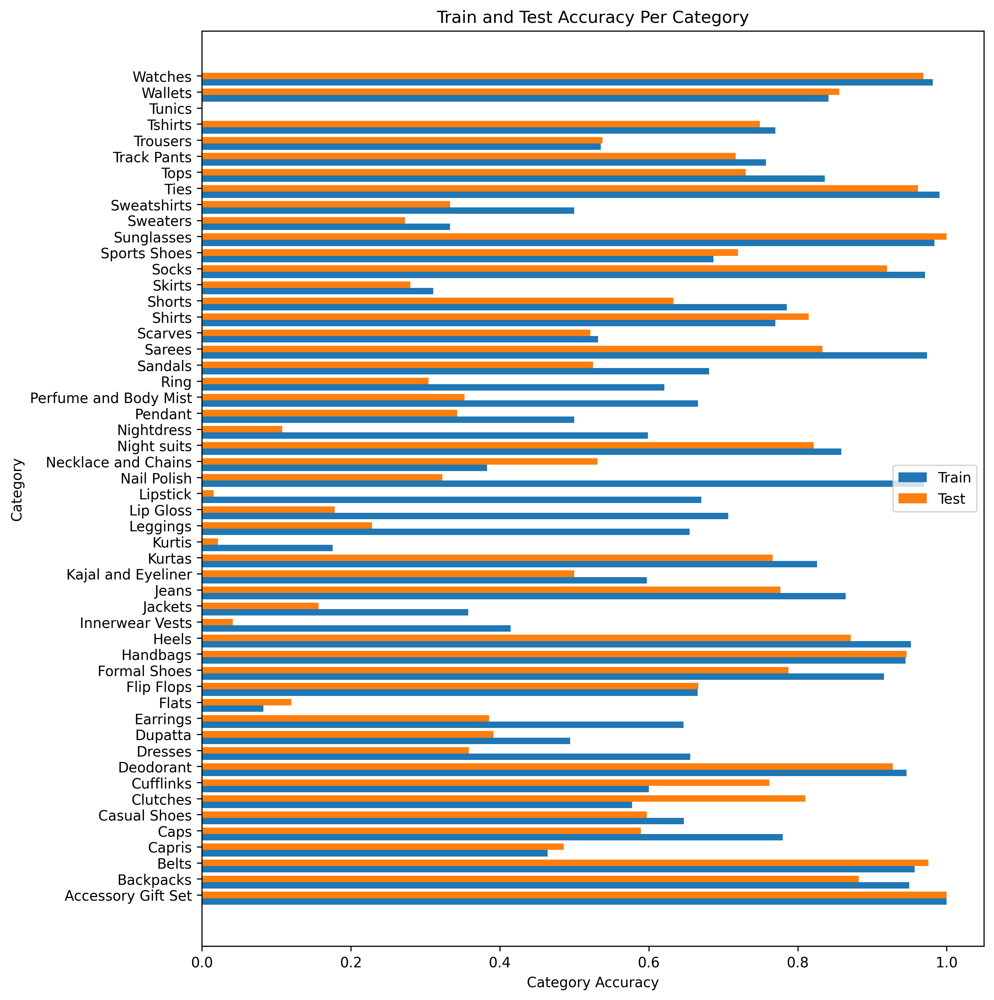

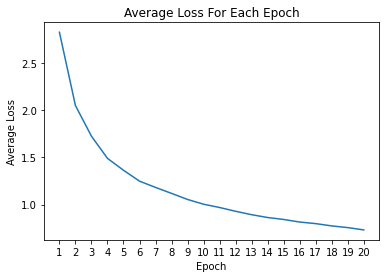

In [28]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.075, momentum=0.0, num_epochs=20)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=20)

## بخش ۱۰
### tanh:
استفاده از این تابع باعث افزایش دقت شده است و میزان loss میانگین نیز کاهش یافته است:

epoch 1, train_loss: 2.487, time elapsed: 31.051946 seconds
epoch 2, train_loss: 1.993, time elapsed: 31.111829 seconds
epoch 3, train_loss: 1.496, time elapsed: 31.346541 seconds
epoch 4, train_loss: 1.340, time elapsed: 30.941578 seconds
epoch 5, train_loss: 1.248, time elapsed: 31.300104 seconds
epoch 6, train_loss: 1.182, time elapsed: 31.400597 seconds
epoch 7, train_loss: 1.092, time elapsed: 31.703246 seconds
epoch 8, train_loss: 1.042, time elapsed: 31.366515 seconds
epoch 9, train_loss: 0.997, time elapsed: 31.440448 seconds
epoch 10, train_loss: 0.957, time elapsed: 31.848691 seconds
total training time: 5.225 minutes
-----------------------
Train Accuracy: %71.10
Test Accuracy:  %67.94
-----------------------


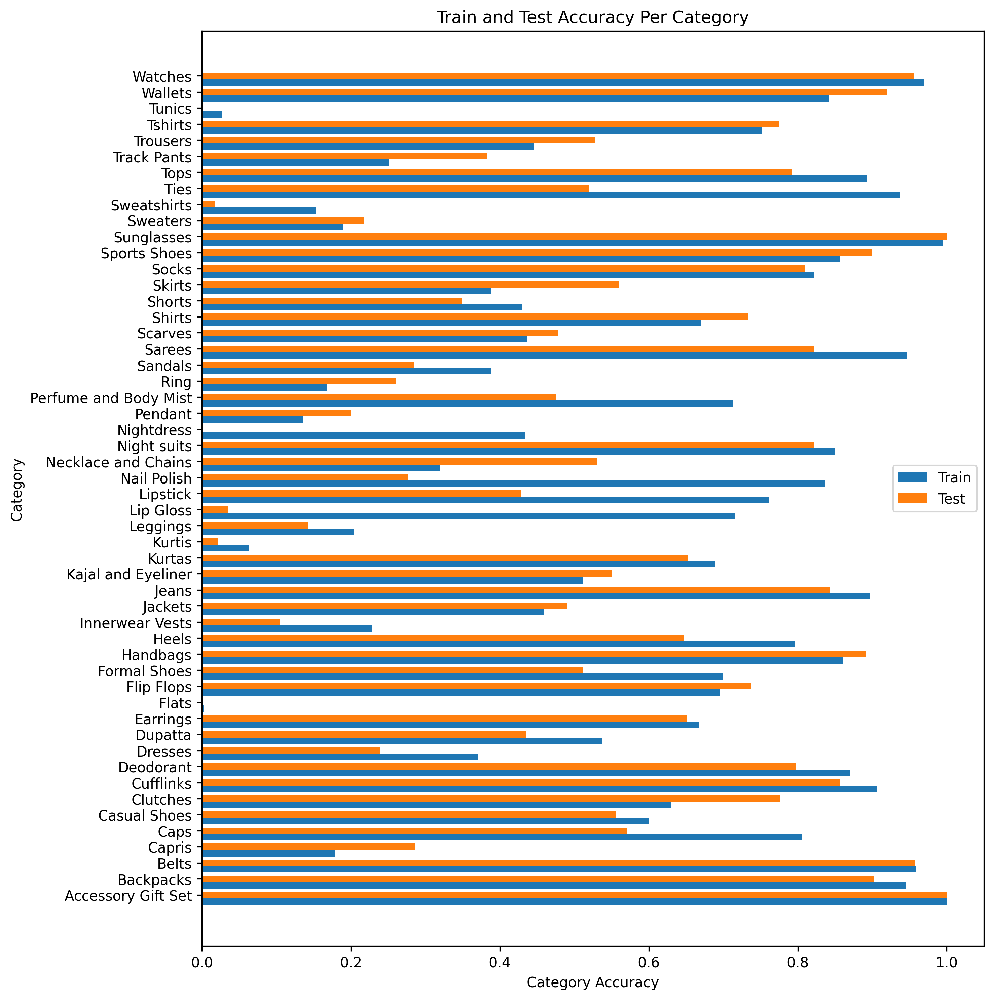

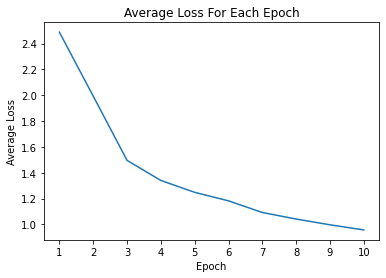

In [29]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.075, momentum=0.0, act=torch.tanh)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

### leaky relu:
استفاده از این تابع کمی از دقت کاسته است اما میزان loss تفاوت چندانی ندارد:

epoch 1, train_loss: 2.821, time elapsed: 31.82949 seconds
epoch 2, train_loss: 2.105, time elapsed: 31.789128 seconds
epoch 3, train_loss: 1.770, time elapsed: 31.326538 seconds
epoch 4, train_loss: 1.543, time elapsed: 31.89192 seconds
epoch 5, train_loss: 1.384, time elapsed: 31.894218 seconds
epoch 6, train_loss: 1.283, time elapsed: 31.634555 seconds
epoch 7, train_loss: 1.192, time elapsed: 31.123952 seconds
epoch 8, train_loss: 1.130, time elapsed: 31.126372 seconds
epoch 9, train_loss: 1.070, time elapsed: 31.153437 seconds
epoch 10, train_loss: 1.020, time elapsed: 30.563833 seconds
total training time: 5.239 minutes
-----------------------
Train Accuracy: %67.92
Test Accuracy:  %64.42
-----------------------


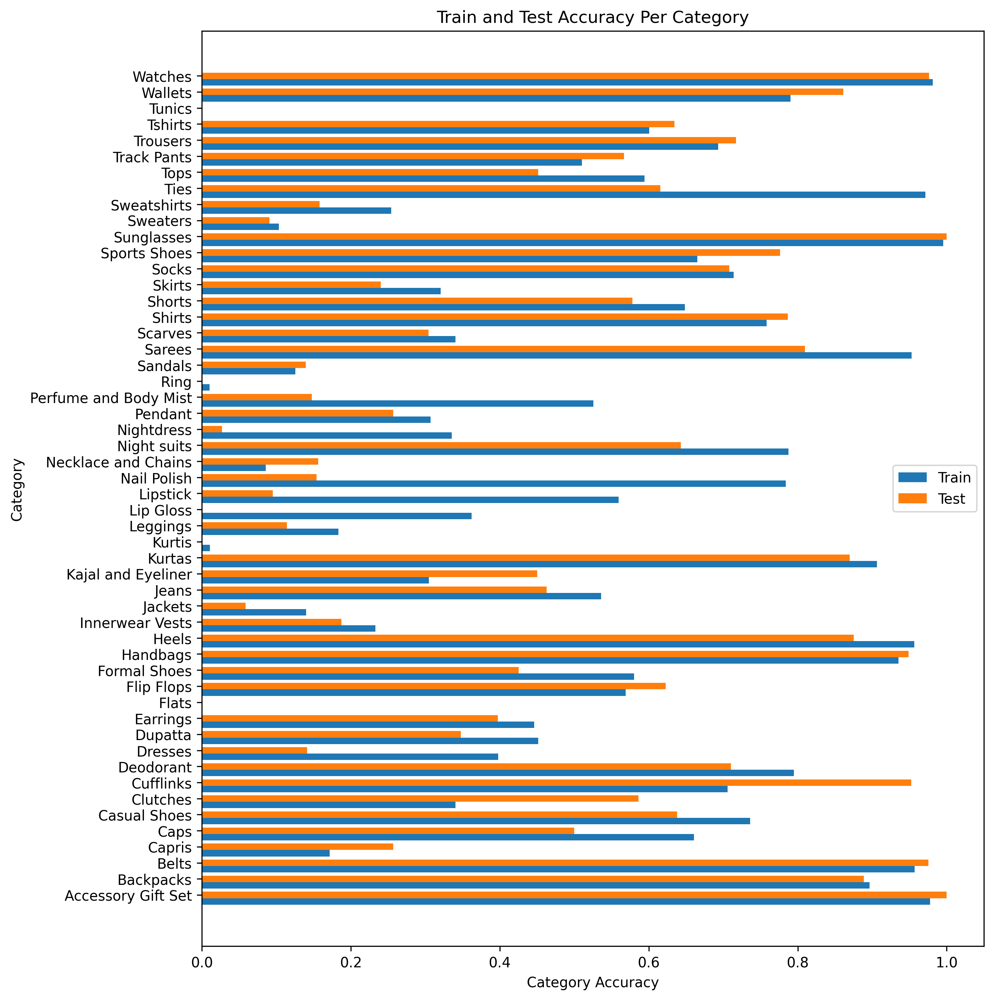

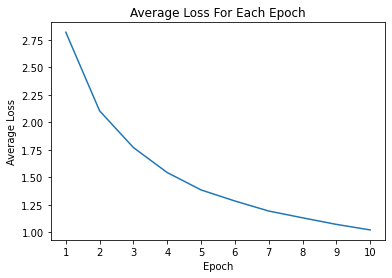

In [30]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.075, momentum=0.0, act=F.leaky_relu)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

## بخش ۱۱
### الف)
این کار با استفاده از افزودن یک ترم در رابطه‌ی تابع هزینه صورت می‌گیرد که در نتیجه‌ی آن، وزن‌ها را کوچک می‌کنیم که این منجر به کاهش پیچیدگی مدل خواهد شد. بدین ترتیب از overfit شدن مدل جلوگیری می‌شود. در واقع این ترم تابع وزن‌هاست و وقتی مشتق گرفته می‌شود، این ترم باعث می‌شود ابتدا وزن‌ها یک بار کاهش پیدا کنند و سپس همان گرادیان قبلی نیز از وزن‌ها کم شود. اثر کاهش وزن‌ها در کاهش پیچیدگی نیز از این‌جا نشأت می‌گیرد که توابع activation از وزن‌ها استفاده می‌کنند و هرچه وزن‌ها کوچک‌تر باشند، نتیجه‌ی این توابع نیز کوچک‌تر می‌شود و در نتیجه تابعی با پیچیدگی کم‌تر روی داده‌ها fit خواهد شد.

![1.png](1.png)
![2.png](2.png)
![3.png](3.png)

### ب)
این تکنیک درواقع در هنگام کاهش وزن‌ها استفاده می‌شود و باعث می‌شود علاوه بر گرادیان، مقدار اضاف‌تری که با وزن‌ها رابطه دارد نیز از وزن‌ها کاسته شود. اگر به روابط بالا دقت کنیم، حالت ساده که در قسمت الف توضیح داده شد در تابع هزینه وجود دارد و اگر مشتق این تابع گرفته شود و گرادیان محاسبه شود، می‌بینیم که در رابطه‌ی سوم یک ترم داریم که در وزن‌ها ضرب می‌شود و آن‌ها را کاهش می‌دهد و سپس گرادیان از آن کم می‌شود. حال در SGD وقتی از weight_decay استفاده کنیم در واقع داریم ضریب وزن‌ها در رابطه‌ی سوم را تعیین می‌کنیم که در واقع این کار دارد به شکل مستقیم صورت می‌گیرد. در حالی که در بخش الف این کار به شکل غیرمستقیم صورت گرفته بود. در نتیجه این کار معادل با همان بخش اول است.

### پ)
مشاهده می‌شود که با این کار، دقت به ۹ درصد کاهش می‌یابد و هم‌چنین میزان loss ثابت می‌ماند. در واقع هیچ‌گونه یادگیری صورت نمی‌گیرد. دلیل این امر می‌تواند بزرگی نسبی این پارامتر باشد که باعث می‌شود مقدار زیادی از وزن‌ها کاسته شود و مینیمم‌ها دیده نشوند.

epoch 1, train_loss: 3.475, time elapsed: 32.162918 seconds
epoch 2, train_loss: 3.432, time elapsed: 32.439375 seconds
epoch 3, train_loss: 3.422, time elapsed: 32.568698 seconds
epoch 4, train_loss: 3.414, time elapsed: 32.913679 seconds
epoch 5, train_loss: 3.412, time elapsed: 32.059098 seconds
epoch 6, train_loss: 3.421, time elapsed: 33.021294 seconds
epoch 7, train_loss: 3.410, time elapsed: 33.964369 seconds
epoch 8, train_loss: 3.411, time elapsed: 33.038668 seconds
epoch 9, train_loss: 3.409, time elapsed: 32.637079 seconds
epoch 10, train_loss: 3.418, time elapsed: 31.950962 seconds
total training time: 5.446 minutes
-----------------------
Train Accuracy: %9.48
Test Accuracy:  %9.49
-----------------------


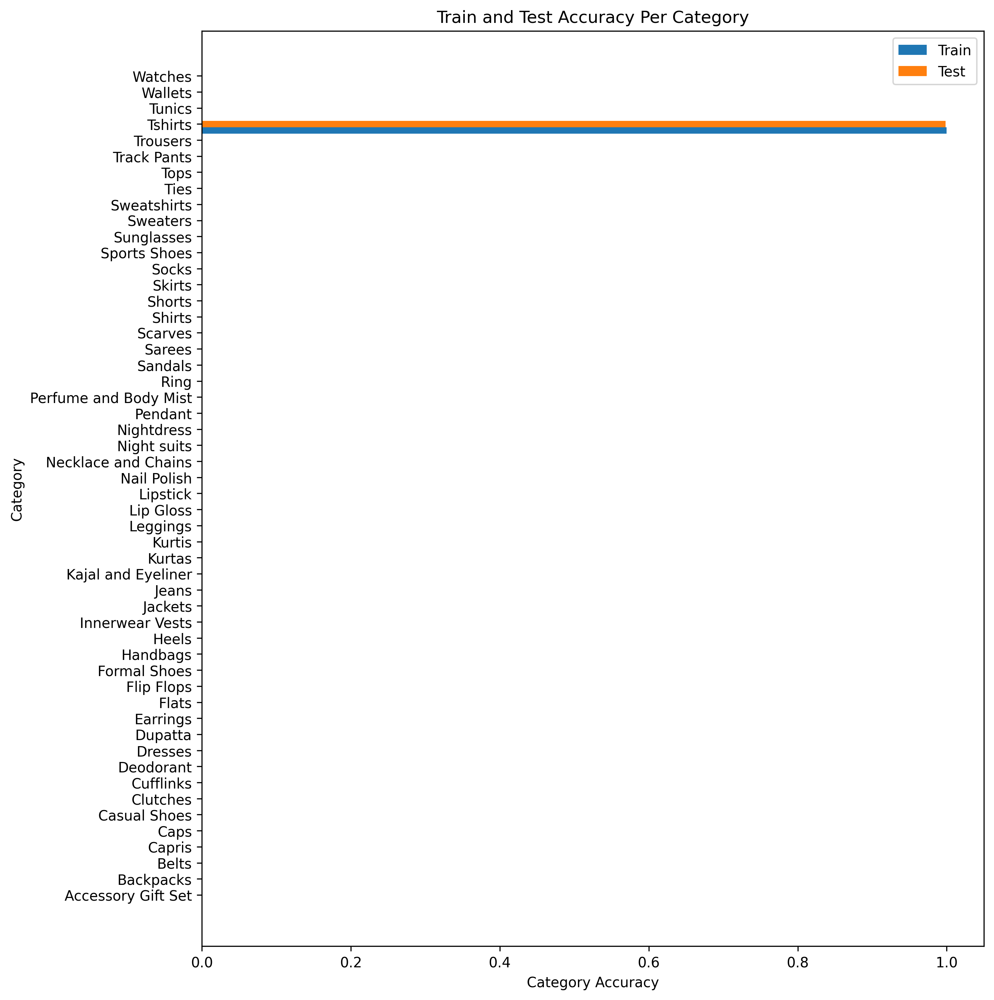

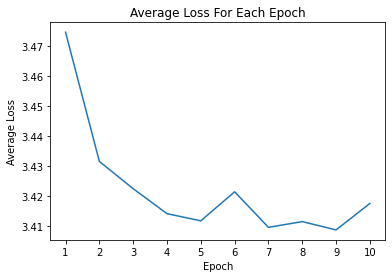

In [31]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.075, momentum=0.0, weight_decay=0.1)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)

### ت)
در این حالت نسبت به مقدار ۰.۱ شاهد افزایش دقت هستیم ولی هم‌چنان دقت کم‌تری نسبت به حالت بهینه‌ی مورد ۸ مشاهده می‌شود. در این مسئله از ابتدا با مشکل overfitting مواجه نبوده‌ایم و افزودن این پارامتر می‌تواند دلیلی بر کاهش دقت یادگیری باشد چون بدون دلیل خاصی وزن‌ها را کاهش می‌دهیم. پس نتیجه می‌گیریم که این کار لزوماً باعث بهبود نتایج نمی‌شود و هم‌چنین در شرایطی که مدل به‌خوبی فیت می‌شود اگر مقدار بالایی برای آن انتخاب شود، دقت نیز با شدت بیشتری کاهش خواهد یافت.

epoch 1, train_loss: 2.932, time elapsed: 31.828807 seconds
epoch 2, train_loss: 2.306, time elapsed: 31.849268 seconds
epoch 3, train_loss: 2.129, time elapsed: 31.349664 seconds
epoch 4, train_loss: 2.050, time elapsed: 30.984032 seconds
epoch 5, train_loss: 2.003, time elapsed: 31.549573 seconds
epoch 6, train_loss: 1.963, time elapsed: 30.954819 seconds
epoch 7, train_loss: 1.964, time elapsed: 31.118689 seconds
epoch 8, train_loss: 1.921, time elapsed: 31.029884 seconds
epoch 9, train_loss: 1.906, time elapsed: 31.059731 seconds
epoch 10, train_loss: 1.895, time elapsed: 30.863144 seconds
total training time: 5.210 minutes
-----------------------
Train Accuracy: %42.57
Test Accuracy:  %43.01
-----------------------


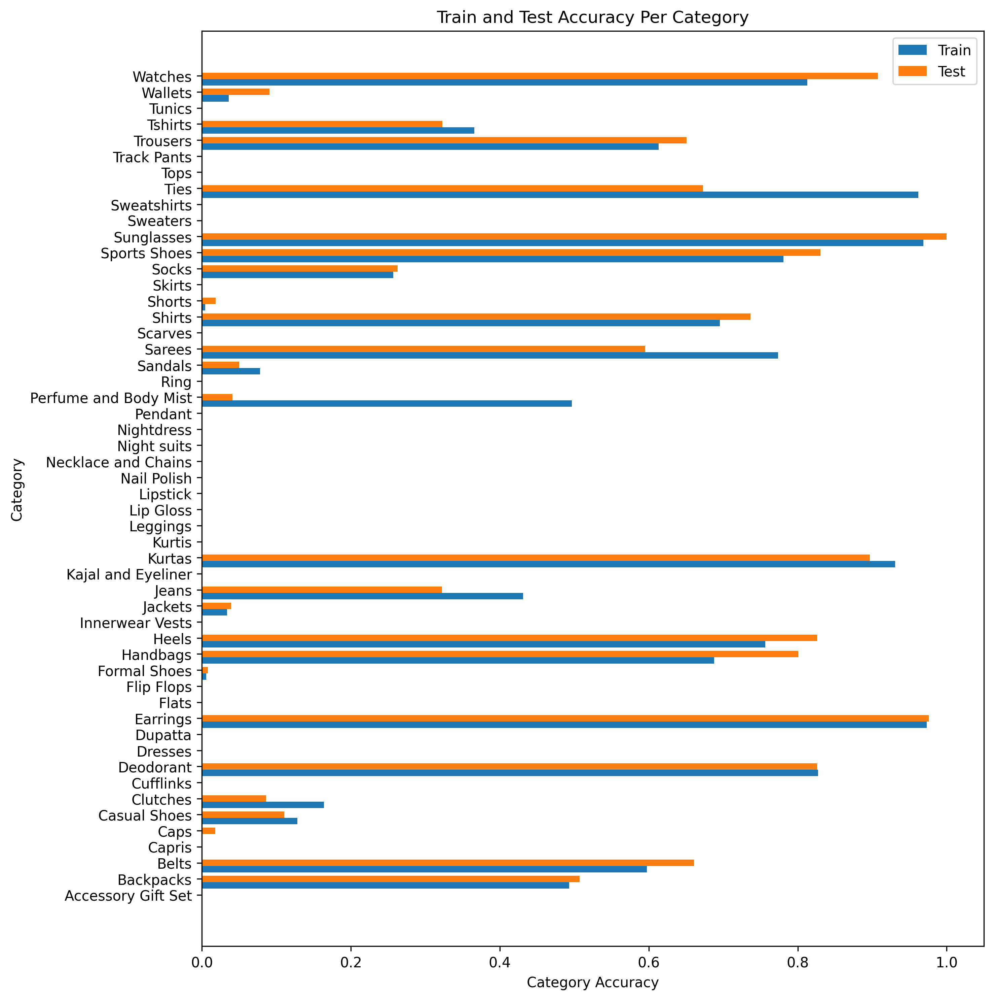

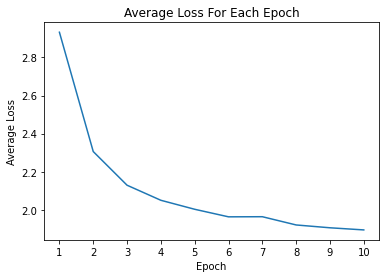

In [32]:
test_accuracy, test_classes_accuracy, train_accuracy, train_classes_accuracy, average_losses = \
  train_and_test(classes, device, train_loader, test_loader, learning_rate=.075, momentum=0.0, weight_decay=0.01)
showcase(classes, train_accuracy, test_accuracy, train_classes_accuracy, test_classes_accuracy, average_losses, num_epochs=10)